The purpose of these experiments is to **think about a property of initialization that end up in small error after training**.

For different initializations of $w$, record: 
- average number of matches for each state 
- loss before gradient descent
- loss after gradient descent

In [1]:
from __future__ import print_function
import tensorflow as tf
import numpy as np
import os,time,seaborn
import matplotlib.pyplot as plt
from sklearn.utils import shuffle

gpu_id = 0

%matplotlib inline

In [2]:
# Architectures. 
# Input will be a dictionary of required arguments (dimensions of certain tensors)
# Output will be a dictionary of access to graph tensors

# Standard 3-layer mlp
def mlp(input_dict):
    p = input_dict['p']
    h = input_dict['h']
    mlp_in = tf.placeholder(tf.float32, shape=[None, p])
    weights1 = tf.get_variable('w1',initializer=tf.random_normal(shape=[p,h],
                                                                 stddev=1./np.sqrt(p)))
    mlp_hidden = tf.nn.relu(tf.matmul(mlp_in, weights1), name='mlp_hidden')
    weights2 = tf.get_variable('w2',initializer=tf.random_normal(shape=[h,1],
                                                                 stddev=1./np.sqrt(h)))
    mlp_out = tf.nn.relu(tf.matmul(mlp_hidden, weights2), name='mlp_output')
    return dict(x=mlp_in,yhat=mlp_out,hid=mlp_hidden,weights1=weights1,weights2=weights2)

In [3]:
def loss(y,yhat):
    return tf.reduce_mean(tf.squared_difference(y,yhat), name='mse')

def w_gap(w,what):
    return tf.reduce_sum([tf.reduce_sum(tf.squared_difference(w[k],what[k])) for k in w])

def graph_builder_wrapper(input_dict,build_func=mlp,lr_initial=0.01,max_save=100):
    y = tf.placeholder(tf.float32, shape=[None,1])
    graph = build_func(input_dict)
    
    w = {k:tf.placeholder(tf.float32, shape=[None,None]) for k in graph if 'weights' in k}
    
    total_loss = loss(y, graph['yhat'])
    total_w_gap = w_gap(w, {k:graph[k] for k in graph if 'weights' in k})
    learning_rate = tf.Variable(lr_initial, name='learning_rate')
    opt_step = tf.train.GradientDescentOptimizer(learning_rate).minimize(total_loss)
    graph['y'] = y
    graph['w'] = w
    graph['opt_step'] = opt_step
    graph['total_loss'] = total_loss
    graph['total_w_gap'] = total_w_gap
    graph['learning_rate'] = learning_rate
    return graph

# Generate random labels with underlying true weights
def generate_random_weights_and_output(X,input_dict,build_func=mlp,batch_size=100,seed=0):    
    tf.reset_default_graph()
    tf.set_random_seed(seed)
    graph = build_func(input_dict)
    y = np.zeros((len(X),1))
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        w = {k:sess.run(graph[k]) for k in graph if 'weights' in k} # grab all weights for graph
        for i in range(0,len(X),batch_size):
            y_ = sess.run(graph['yhat'],feed_dict={graph['x']: X[i:i+batch_size]})
            y[i:i+batch_size] = y_
    return y,w

# Generate random labels with underlying true weights
def generate_output(X,w,build_func=mlp,batch_size=100):    
    tf.reset_default_graph()
    graph = build_func(input_dict)
    y = np.zeros((len(X),1))
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for k in w: sess.run(graph[k].assign(w[k]))
        for i in range(0,len(X),batch_size):
            y_ = sess.run(graph['yhat'],feed_dict={graph['x']:X[i:i+batch_size]})
            y[i:i+batch_size] = y_
    return y

def generate_loss(X,Y,w,build_func=mlp,batch_size=100):
    tf.reset_default_graph()
    graph = graph_builder_wrapper(input_dict,build_func=build_func)
    L = []
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for k in w: sess.run(graph[k].assign(w[k]))
        for i in range(0,len(X),batch_size):
            feed_dict = {graph['x']: X[i:i+batch_size], graph['y']: Y[i:i+batch_size]}
            L.append(sess.run(graph['total_loss'],feed_dict=feed_dict))
    return np.mean(L)

def compute_wgap_and_loss(X,Y,w_true,graph,sess,batch_size=100):
    l = []
    for i in range(0,len(X),batch_size):
        x,y = X[i:i+batch_size], Y[i:i+batch_size]
        l.append(sess.run(graph['total_loss'],feed_dict={graph['x']:x,graph['y']:y}))
    wg = sess.run(graph['total_w_gap'],feed_dict={graph['w'][k]:w_true[k] for k in w_true})
    return wg, np.mean(l)

# Training
# w_initial should be a dictionary with keys corresponding to weight matrices in the graph
def train(X,Y,graph,num_epochs,batch_size,w_true,w_initial=None,verbose=True):

    if verbose: start = time.time()
    training_losses = []
    training_w_gaps = []
    with tf.Session(config=tf.ConfigProto(allow_soft_placement=True)) as sess:
        sess.run(tf.global_variables_initializer())
        if w_initial is not None: 
            for k in w_initial: sess.run(graph[k].assign(w_initial[k]))
                
        # Compute initial w gap and loss
        initial_train_w_gap,initial_train_loss = compute_wgap_and_loss(X,Y,w_true,graph,sess,
                                                                       batch_size=batch_size)
        
        for epoch in range(num_epochs):
            lr = 0.01*0.95**(epoch/390.) # initial lr * decay rate ^(step/decay_steps)
            sess.run(graph['learning_rate'].assign(lr))
            t = time.time()
            training_loss = 0
            training_w_gap = 0
            steps = 0.
            X_, Y_ = shuffle(X,Y)
            for i in range(0,len(X),batch_size):
                x,y = X_[i:i+batch_size], Y_[i:i+batch_size]
                feed_dict = {graph['w'][k]:w_true[k] for k in w_true}
                feed_dict[graph['x']] = x
                feed_dict[graph['y']] = y
                training_loss_,training_w_gap_,_ = sess.run([graph['total_loss'],
                                                             graph['total_w_gap'],
                                                             graph['opt_step']],
                                                            feed_dict=feed_dict)
                training_loss += training_loss_
                training_w_gap += training_w_gap_
                steps += 1.
                
                if verbose:
                    print('\rEpoch %s/%s (%.3f s), batch %s/%s (%.3f s): loss %.3f, w gap: %.3f'
                          %(epoch+1,num_epochs,time.time()-start,steps,
                            len(X_)/batch_size,time.time()-t,
                            training_loss_,training_w_gap_),end='')
            training_losses.append(training_loss/steps)
            training_w_gaps.append(training_w_gap/steps)

        w_hat = {k:sess.run(graph[k]) for k in graph if 'weights' in k} # grab all final weights
        final_w_gap,final_train_loss = compute_wgap_and_loss(X,Y,w_true,graph,sess,
                                                             batch_size=batch_size)
    
    if verbose: print('')
    return training_losses,training_w_gaps,w_hat, \
           initial_train_loss,initial_train_w_gap,final_train_loss,final_w_gap

# Get hidden node states (either on or off) using given weights
# weights is a dictionary with keys corresponding to weight matrices in the graph
def get_hidden_states(X,input_dict,weights,build_func=mlp,batch_size=100):
    tf.reset_default_graph()
    graph = build_func(input_dict)
    states = []
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for i in range(0,len(X),batch_size):
            feed_dict = {graph[k]:weights[k] for k in weights}
            feed_dict[graph['x']] = X[i:i+batch_size]
            if 'hid' in graph: hout_ = sess.run(graph['hid'],feed_dict=feed_dict)
            else: hout_ = sess.run(graph['yhat'],feed_dict=feed_dict)
            states.append(hout_)
    return np.vstack(states) > 0

In [4]:
# Functions for generating data
def generate_X(N,q,input_dict):
    # generate covariance matrix approach 1: all iid
    # C = np.eye(p)
    # A = np.eye(p)
    # generate covariance matrix approach 2: low-rank covariance matrix
    p = input_dict['p']
    A = np.random.normal(0,1,[p,q])
    C = np.dot(A,A.T)
    u,s,v = np.linalg.svd(C)
    C /= np.sum(s[:q])/p               # Scale C to ensure eigenvalues sum up to p
    u,v = np.linalg.eigh(C)
    u[u < 0] = 0
    A = np.dot(v,np.diag(np.sqrt(u)))
    B = np.random.normal(0,1,(10,10))  # Rotate A by random matrix to ensure samples are dense
    u,v = np.linalg.eigh(C)
    A = np.dot(A,v)
    X = np.dot(np.random.normal(0,1,[N,p]),A.T) # sample X
    return X

def generate_data(N,q,input_dict,seed=0,build_func=mlp):
    np.random.seed(seed)
    X = generate_X(N,q,input_dict)
    Y,weights = generate_random_weights_and_output(X,input_dict,build_func=build_func)
    hs = get_hidden_states(X,input_dict,weights,build_func=build_func)
    return X,Y,hs,weights

In [5]:
def run_experiment(X,Y,hs_true,w_true,input_dict,num_sims,build_func=mlp,plot=False,
                   init_perturb_w_true=None,verbose=True,num_epochs=200,return_weights=False):
    
    if 'h' in input_dict: h = input_dict['h']
    else: h = 1
    p = input_dict['p']
    
    all_prop_matched_states = np.zeros((num_sims,h))
    all_final_loss = np.zeros(num_sims)
    all_final_w_gaps = np.zeros(num_sims)
    all_initial_w_gaps = np.zeros(num_sims)
    if return_weights: all_weights = []
    
    if verbose: start = time.time()
    
    for t in range(num_sims):

        # Generate w
        if init_perturb_w_true is None:
            weights = {k:np.random.normal(0,1./np.sqrt(np.shape(w_true[k])[0]),
                                          np.shape(w_true[k])) for k in w_true}
        else:
            weights = {k:w_true[k]+np.random.normal(0,(1./np.sqrt(np.shape(w_true[k])[0]))/init_perturb_w_true,
                                          np.shape(w_true[k])) for k in w_true}
            
        # Get number of matching states for hidden layer
        hs_ = get_hidden_states(X,input_dict,weights,build_func=build_func)
        all_prop_matched_states[t] = np.mean(hs_ == hs,0)

        # Compute loss after gradient descent
        tf.reset_default_graph()
        graph = graph_builder_wrapper(input_dict,build_func=build_func)
        training_losses,training_w_gaps,w_hat,initial_train_loss,initial_train_w_gap,final_train_loss,final_w_gap = \
                train(X,Y,graph,num_epochs,100,w,w_initial=weights,verbose=verbose)
        all_final_loss[t] = final_train_loss
        all_final_w_gaps[t] = final_w_gap
        all_initial_w_gaps[t] = initial_train_w_gap
        if return_weights: all_weights.append(w_hat)

        if plot:
            plt.figure(figsize=(10,5))
            plt.subplot(121)
            plt.plot(training_w_gaps)
            plt.xlabel('epochs')
            plt.ylabel('w gap')
            plt.subplot(122)
            plt.plot(training_losses)
            plt.xlabel('epochs')
            plt.ylabel('training loss')

        if verbose: print('Done with %s/%s (%.2f s elapsed)'%(t+1,num_sims,time.time()-start))
        
    if return_weights: 
        return all_prop_matched_states,all_final_loss,all_final_w_gaps,all_initial_w_gaps,all_weights
    return all_prop_matched_states,all_final_loss,all_final_w_gaps,all_initial_w_gaps

def generate_all_plots(all_prop_matched_states,all_final_loss,all_final_w_gaps,all_initial_w_gaps):
    f, ((ax1,ax2,ax3),(ax4,ax5,ax6)) = plt.subplots(2,3,figsize=(16,10))
    seaborn.regplot(np.mean(all_prop_matched_states,1),all_final_loss,ax=ax1)
    ax1.set(xlabel='proportion of matched states', ylabel='final loss')
    seaborn.regplot(all_initial_w_gaps,all_final_loss,ax=ax2)
    ax2.set(xlabel='initial w gap', ylabel='final loss')
    seaborn.regplot(all_initial_w_gaps,all_final_w_gaps,ax=ax3)
    ax3.set(xlabel='initial w gap', ylabel='final w gap')
    seaborn.regplot(np.mean(all_prop_matched_states,1),all_final_w_gaps,ax=ax4)
    ax4.set(xlabel='proportion of matched states', ylabel='final w gap')
    seaborn.regplot(all_initial_w_gaps,np.mean(all_prop_matched_states,1),ax=ax5)
    ax5.set(xlabel='initial w gap', ylabel='proportion of matched states')
    seaborn.regplot(all_final_w_gaps,all_final_loss,ax=ax6)
    ax6.set(xlabel='final w gap', ylabel='final loss')
    c = (np.max(all_final_loss)-np.min(all_final_loss))*0.1
    ax6.set_ylim(np.min(all_final_loss)-c,np.max(all_final_loss)+c)
    c = (np.max(all_final_w_gaps)-np.min(all_final_w_gaps))*0.1
    ax6.set_xlim(np.min(all_final_w_gaps)-c,np.max(all_final_w_gaps)+c)

### Experiment 1

3-layer MLP, test for low-rank and full-rank matrices.

In [6]:
# Parameters
p = 10    # number of dimensions
N = 1000  # number of samples
q = 4     # rank of covariance matrix for generating samples
h = 3     # number of hidden units

input_dict = dict(p=p,h=h)
X,Y,hs,w = generate_data(N,q,input_dict,seed=0,build_func=mlp)

all_prop_matched_states,all_final_loss,all_final_w_gaps,all_initial_w_gaps = \
    run_experiment(X,Y,hs,w,input_dict,100,build_func=mlp,plot=False)

Epoch 19/200 (0.221 s), batch 3.0/10 (0.003 s): loss 0.033, w gap: 7.752

Epoch 36/200 (0.420 s), batch 10.0/10 (0.009 s): loss 0.020, w gap: 7.811

Epoch 54/200 (0.624 s), batch 6.0/10 (0.004 s): loss 0.009, w gap: 7.832

Epoch 70/200 (0.824 s), batch 7.0/10 (0.005 s): loss 0.007, w gap: 7.835

Epoch 85/200 (1.022 s), batch 10.0/10 (0.009 s): loss 0.006, w gap: 7.836

Epoch 100/200 (1.226 s), batch 10.0/10 (0.008 s): loss 0.005, w gap: 7.832

Epoch 115/200 (1.433 s), batch 9.0/10 (0.008 s): loss 0.013, w gap: 7.828

Epoch 129/200 (1.633 s), batch 7.0/10 (0.009 s): loss 0.013, w gap: 7.824

Epoch 140/200 (1.799 s), batch 10.0/10 (0.008 s): loss 0.007, w gap: 7.820

Epoch 154/200 (2.035 s), batch 10.0/10 (0.008 s): loss 0.006, w gap: 7.814

Epoch 168/200 (2.242 s), batch 2.0/10 (0.002 s): loss 0.006, w gap: 7.807

Epoch 180/200 (2.438 s), batch 10.0/10 (0.007 s): loss 0.009, w gap: 7.801

Epoch 193/200 (2.644 s), batch 10.0/10 (0.007 s): loss 0.008, w gap: 7.793

Epoch 200/200 (2.759 s), batch 10.0/10 (0.008 s): loss 0.005, w gap: 7.789
Done with 1/100 (2.82 s elapsed)
Epoch 200/200 (2.834 s), batch 10.0/10 (0.007 s): loss 0.004, w gap: 4.068
Done with 2/100 (5.72 s elapsed)
Epoch 200/200 (2.831 s), batch 10.0/10 (0.010 s): loss 0.233, w gap: 9.187
Done with 3/100 (8.61 s elapsed)
Epoch 200/200 (2.848 s), batch 10.0/10 (0.012 s): loss 0.002, w gap: 5.154
Done with 4/100 (11.53 s elapsed)
Epoch 200/200 (2.969 s), batch 10.0/10 (0.008 s): loss 0.001, w gap: 4.478
Done with 5/100 (14.56 s elapsed)
Epoch 200/200 (2.838 s), batch 10.0/10 (0.009 s): loss 0.011, w gap: 9.591
Done with 6/100 (17.47 s elapsed)
Epoch 200/200 (2.845 s), batch 10.0/10 (0.009 s): loss 0.008, w gap: 8.748
Done with 7/100 (20.38 s elapsed)
Epoch 200/200 (3.070 s), batch 10.0/10 (0.009 s): loss 0.019, w gap: 8.199
Done with 8/100 (23.51 s elapsed)
Epoch 200/200 (2.855 s), batch 10.0/10 (0.009 s): loss 0.004, w gap: 6.789
Done with 9/100 (26.44 s elapsed)
Epoch 200/200 (2.864 s

Epoch 35/200 (0.423 s), batch 9.0/10 (0.008 s): loss 0.167, w gap: 7.393

Epoch 51/200 (0.623 s), batch 9.0/10 (0.007 s): loss 0.351, w gap: 7.393

Epoch 67/200 (0.825 s), batch 9.0/10 (0.009 s): loss 0.192, w gap: 7.393

Epoch 83/200 (1.027 s), batch 6.0/10 (0.005 s): loss 0.202, w gap: 7.393

Epoch 98/200 (1.228 s), batch 5.0/10 (0.004 s): loss 0.269, w gap: 7.393

Epoch 112/200 (1.429 s), batch 8.0/10 (0.007 s): loss 0.361, w gap: 7.393

Epoch 126/200 (1.628 s), batch 10.0/10 (0.010 s): loss 0.277, w gap: 7.393

Epoch 140/200 (1.834 s), batch 8.0/10 (0.007 s): loss 0.258, w gap: 7.393

Epoch 153/200 (2.029 s), batch 10.0/10 (0.009 s): loss 0.242, w gap: 7.393

Epoch 166/200 (2.231 s), batch 10.0/10 (0.011 s): loss 0.236, w gap: 7.393

Epoch 179/200 (2.439 s), batch 10.0/10 (0.009 s): loss 0.292, w gap: 7.393

Epoch 192/200 (2.648 s), batch 7.0/10 (0.005 s): loss 0.274, w gap: 7.393

Epoch 200/200 (2.779 s), batch 10.0/10 (0.007 s): loss 0.400, w gap: 7.393
Done with 75/100 (218.23 s elapsed)
Epoch 200/200 (2.817 s), batch 10.0/10 (0.007 s): loss 0.007, w gap: 7.764
Done with 76/100 (221.11 s elapsed)
Epoch 200/200 (2.805 s), batch 10.0/10 (0.007 s): loss 0.013, w gap: 8.127
Done with 77/100 (223.98 s elapsed)
Epoch 200/200 (2.989 s), batch 10.0/10 (0.008 s): loss 0.006, w gap: 8.146
Done with 78/100 (227.04 s elapsed)
Epoch 200/200 (2.808 s), batch 10.0/10 (0.008 s): loss 0.009, w gap: 7.403
Done with 79/100 (229.91 s elapsed)
Epoch 200/200 (2.820 s), batch 10.0/10 (0.011 s): loss 0.005, w gap: 5.430
Done with 80/100 (232.80 s elapsed)
Epoch 200/200 (2.781 s), batch 10.0/10 (0.008 s): loss 0.009, w gap: 8.152
Done with 81/100 (235.67 s elapsed)
Epoch 200/200 (2.813 s), batch 10.0/10 (0.010 s): loss 0.001, w gap: 8.737
Done with 82/100 (238.62 s elapsed)
Epoch 200/200 (2.778 s), batch 10.0/10 (0.009 s): loss 0.006, w gap: 8.433
Done with 83/100 (241.46 s elapsed)
E

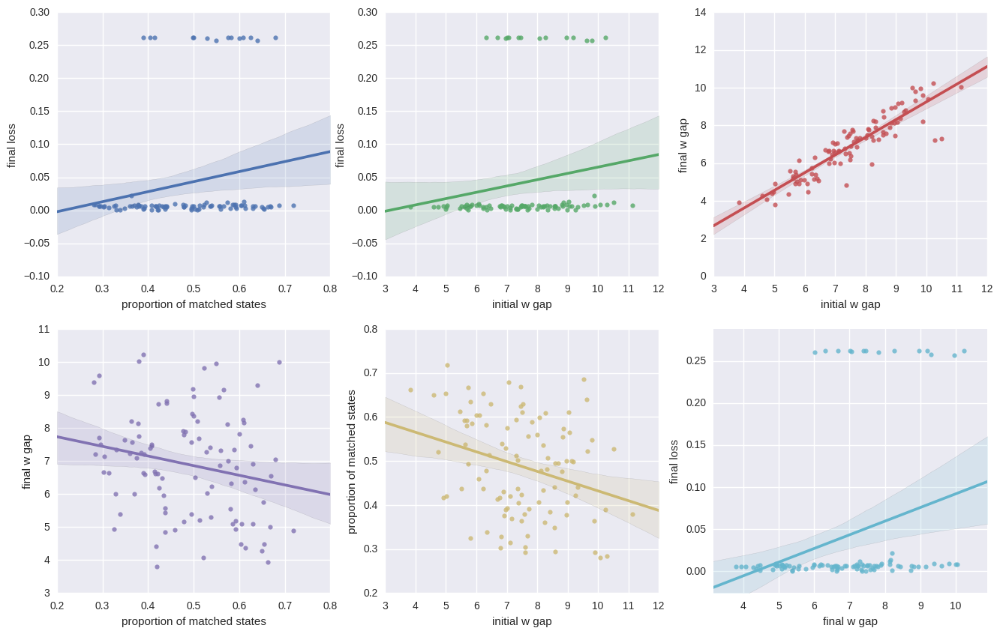

In [7]:
generate_all_plots(all_prop_matched_states,all_final_loss,all_final_w_gaps,all_initial_w_gaps)

In [8]:
# Repeat with full rank matrix

p = 10    # number of dimensions
N = 1000  # number of samples
q = p     # rank of covariance matrix for generating samples
h = 3     # number of hidden units

input_dict = dict(p=p,h=h)
X,Y,hs,w = generate_data(N,q,input_dict,seed=0,build_func=mlp)

all_prop_matched_states,all_final_loss,all_final_w_gaps,all_initial_w_gaps = \
    run_experiment(X,Y,hs,w,input_dict,100,build_func=mlp,plot=False)

Epoch 13/200 (0.221 s), batch 1.0/10 (0.002 s): loss 0.061, w gap: 4.339

Epoch 29/200 (0.422 s), batch 4.0/10 (0.003 s): loss 0.032, w gap: 4.401

Epoch 44/200 (0.624 s), batch 7.0/10 (0.008 s): loss 0.035, w gap: 4.389

Epoch 59/200 (0.825 s), batch 7.0/10 (0.006 s): loss 0.014, w gap: 4.352

Epoch 73/200 (1.025 s), batch 10.0/10 (0.009 s): loss 0.015, w gap: 4.314

Epoch 88/200 (1.231 s), batch 3.0/10 (0.003 s): loss 0.010, w gap: 4.283

Epoch 101/200 (1.432 s), batch 10.0/10 (0.009 s): loss 0.009, w gap: 4.261

Epoch 114/200 (1.632 s), batch 10.0/10 (0.010 s): loss 0.008, w gap: 4.243

Epoch 127/200 (1.833 s), batch 10.0/10 (0.010 s): loss 0.007, w gap: 4.228

Epoch 140/200 (2.041 s), batch 7.0/10 (0.008 s): loss 0.006, w gap: 4.218

Epoch 152/200 (2.242 s), batch 7.0/10 (0.005 s): loss 0.005, w gap: 4.210

Epoch 164/200 (2.442 s), batch 2.0/10 (0.002 s): loss 0.004, w gap: 4.205

Epoch 176/200 (2.639 s), batch 10.0/10 (0.008 s): loss 0.004, w gap: 4.200

Epoch 189/200 (2.847 s), batch 6.0/10 (0.005 s): loss 0.005, w gap: 4.197

Epoch 200/200 (3.029 s), batch 10.0/10 (0.010 s): loss 0.003, w gap: 4.196
Done with 1/100 (3.10 s elapsed)


Epoch 18/200 (0.219 s), batch 10.0/10 (0.009 s): loss 0.032, w gap: 4.364

Epoch 35/200 (0.421 s), batch 10.0/10 (0.009 s): loss 0.015, w gap: 4.234

Epoch 52/200 (0.626 s), batch 3.0/10 (0.002 s): loss 0.011, w gap: 4.145

Epoch 68/200 (0.826 s), batch 1.0/10 (0.001 s): loss 0.011, w gap: 4.075

Epoch 83/200 (1.027 s), batch 5.0/10 (0.005 s): loss 0.011, w gap: 4.021

Epoch 97/200 (1.222 s), batch 10.0/10 (0.011 s): loss 0.007, w gap: 3.975

Epoch 111/200 (1.423 s), batch 10.0/10 (0.008 s): loss 0.006, w gap: 3.936

Epoch 125/200 (1.625 s), batch 10.0/10 (0.008 s): loss 0.006, w gap: 3.900

Epoch 139/200 (1.829 s), batch 10.0/10 (0.007 s): loss 0.008, w gap: 3.867

Epoch 153/200 (2.036 s), batch 7.0/10 (0.008 s): loss 0.007, w gap: 3.838

Epoch 166/200 (2.235 s), batch 10.0/10 (0.009 s): loss 0.005, w gap: 3.810

Epoch 179/200 (2.443 s), batch 8.0/10 (0.007 s): loss 0.005, w gap: 3.786

Epoch 192/200 (2.644 s), batch 4.0/10 (0.004 s): loss 0.005, w gap: 3.764

Epoch 200/200 (2.779 s), batch 10.0/10 (0.009 s): loss 0.004, w gap: 3.751
Done with 2/100 (5.94 s elapsed)
Epoch 200/200 (2.778 s), batch 10.0/10 (0.009 s): loss 0.172, w gap: 9.187
Done with 3/100 (8.78 s elapsed)
Epoch 200/200 (2.962 s), batch 10.0/10 (0.008 s): loss 0.014, w gap: 6.202
Done with 4/100 (11.81 s elapsed)
Epoch 200/200 (2.801 s), batch 10.0/10 (0.007 s): loss 0.063, w gap: 3.829
Done with 5/100 (14.71 s elapsed)
Epoch 200/200 (2.808 s), batch 10.0/10 (0.008 s): loss 0.011, w gap: 8.408
Done with 6/100 (17.58 s elapsed)
Epoch 200/200 (2.803 s), batch 10.0/10 (0.008 s): loss 0.049, w gap: 7.830
Done with 7/100 (20.45 s elapsed)
Epoch 200/200 (2.844 s), batch 10.0/10 (0.010 s): loss 0.071, w gap: 9.4685
Done with 8/100 (23.36 s elapsed)
Epoch 200/200 (2.786 s), batch 10.0/10 (0.008 s): loss 0.012, w gap: 6.434
Done with 9/100 (26.20 s elapsed)
Epoch 200/200 (2.816 s), batch 10.0/10 (0.012 s): loss 0.061, w gap: 8.794
Done with 10/100 (29.08 s elapsed)
Epoch 200/200 (2.94

Epoch 34/200 (0.423 s), batch 10.0/10 (0.011 s): loss 0.057, w gap: 7.342

Epoch 51/200 (0.628 s), batch 8.0/10 (0.007 s): loss 0.071, w gap: 7.219

Epoch 67/200 (0.829 s), batch 7.0/10 (0.005 s): loss 0.045, w gap: 7.131

Epoch 82/200 (1.032 s), batch 7.0/10 (0.005 s): loss 0.048, w gap: 7.151

Epoch 97/200 (1.232 s), batch 1.0/10 (0.001 s): loss 0.068, w gap: 7.193

Epoch 111/200 (1.431 s), batch 10.0/10 (0.009 s): loss 0.042, w gap: 7.237

Epoch 125/200 (1.637 s), batch 9.0/10 (0.009 s): loss 0.039, w gap: 7.278

Epoch 139/200 (1.838 s), batch 3.0/10 (0.002 s): loss 0.035, w gap: 7.318

Epoch 152/200 (2.038 s), batch 5.0/10 (0.004 s): loss 0.041, w gap: 7.357

Epoch 164/200 (2.236 s), batch 10.0/10 (0.010 s): loss 0.032, w gap: 7.397

Epoch 177/200 (2.439 s), batch 10.0/10 (0.009 s): loss 0.034, w gap: 7.439

Epoch 190/200 (2.644 s), batch 10.0/10 (0.009 s): loss 0.035, w gap: 7.480

Epoch 200/200 (2.800 s), batch 10.0/10 (0.008 s): loss 0.034, w gap: 7.508
Done with 76/100 (220.75 s elapsed)
Epoch 200/200 (2.790 s), batch 10.0/10 (0.008 s): loss 0.030, w gap: 7.008
Done with 77/100 (223.61 s elapsed)
Epoch 200/200 (2.815 s), batch 10.0/10 (0.008 s): loss 0.074, w gap: 7.179
Done with 78/100 (226.55 s elapsed)
Epoch 200/200 (2.801 s), batch 10.0/10 (0.007 s): loss 0.045, w gap: 8.145
Done with 79/100 (229.42 s elapsed)
Epoch 200/200 (2.817 s), batch 10.0/10 (0.010 s): loss 0.036, w gap: 4.030
Done with 80/100 (232.30 s elapsed)
Epoch 200/200 (2.993 s), batch 10.0/10 (0.008 s): loss 0.046, w gap: 8.087
Done with 81/100 (235.36 s elapsed)
Epoch 200/200 (2.778 s), batch 10.0/10 (0.008 s): loss 0.014, w gap: 7.218
Done with 82/100 (238.20 s elapsed)
Epoch 200/200 (2.797 s), batch 10.0/10 (0.009 s): loss 0.011, w gap: 7.146
Done with 83/100 (241.06 s elapsed)
Epoch 200/200 (2.811 s), batch 10.0/10 (0.007 s): loss 0.043, w gap: 8.422
Done with 84/100 (243.94 s elapsed)
E

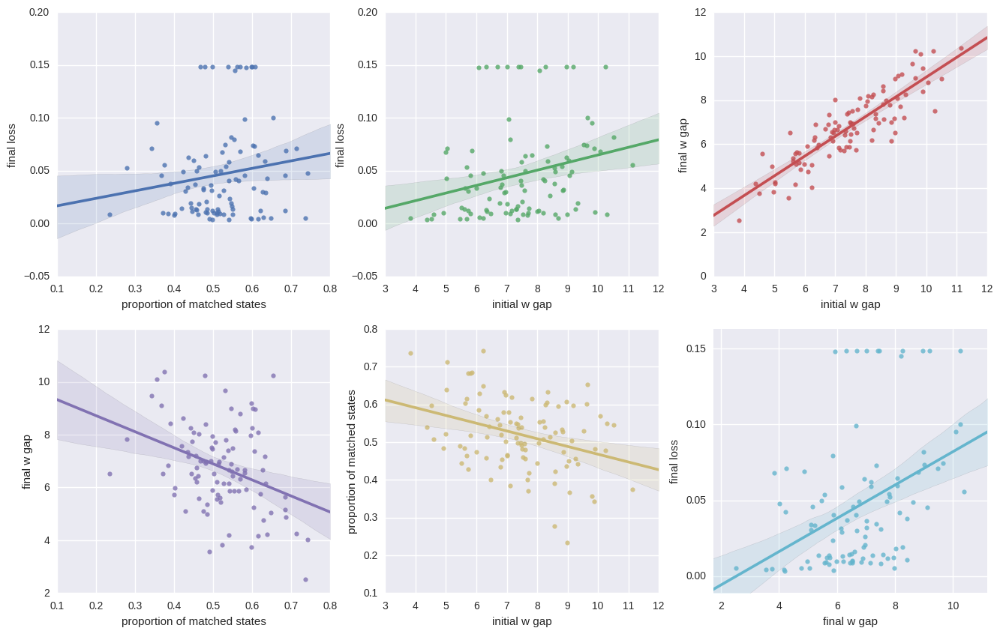

In [9]:
generate_all_plots(all_prop_matched_states,all_final_loss,all_final_w_gaps,all_initial_w_gaps)

### Experiment 2

Simply MLP with one neuron and two inputs. I.e., $y=\sigma (w_1 x_1+w_2 x_2)$.

Test for low dimension (2) and high dimension (10) cases, both with full rank matrices.

In [10]:
def mlp_simple(input_dict):
    # 2-layer net. out = relu(<weights,mlp_in>)
    p = input_dict['p']
    mlp_in = tf.placeholder(tf.float32, shape=[None, p])
    weights = tf.get_variable('w',initializer=tf.random_normal(shape=[p,1],
                                                               stddev=1./np.sqrt(p)))
    mlp_out = tf.nn.relu(tf.matmul(mlp_in, weights), name='mlp_out')
    return dict(x=mlp_in,yhat=mlp_out,weights=weights)

# Generate 3D plot of loss function (for mlp simple)
def compute_L(X,Y,all_wi,all_wj,input_dict):
    n = len(all_wi)
    L = np.zeros((n,n))
    start = time.time()
    for i,wi in enumerate(all_wi):
        for j,wj in enumerate(all_wj):
            w = {'weights':np.array([[wi],[wj]])}
            L[i,j] = generate_loss(X,Y,w,build_func=mlp_simple)
            print('\r%s/%s, %s/%s (%.2f s elapsed)'%(i+1,n,j+1,n,time.time()-start),end='')
    return L

from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
def plot_L_3D(all_wi,all_wj,L,w1_opt,w2_opt,L_opt):
    fig = plt.figure(figsize=(10,10))
    ax = plt.gca(projection='3d')

    wi,wj = np.meshgrid(all_wi,all_wj)
    surf = ax.plot_surface(wi, wj, L, cmap=cm.coolwarm,
                                rstride=10, cstride=10)
    ax.scatter(w1_opt,w2_opt,L_opt,c='r')
    ax.set_xlabel('w1')
    ax.set_ylabel('w2')
    ax.set_zlabel('loss')
    plt.show()

In [11]:
# Parameters
p = 2    # number of dimensions
N = 1000  # number of samples
q = 2     # rank of covariance matrix for generating samples
h = 1     # number of hidden units

input_dict = dict(p=p,h=h)
X,Y,hs,w = generate_data(N,q,input_dict,seed=0,build_func=mlp_simple)
print(generate_loss(X,Y,w,build_func=mlp_simple)) # Check to make sure optimal loss is 0

all_prop_matched_states,all_final_loss,all_final_w_gaps,all_initial_w_gaps = \
    run_experiment(X,Y,hs,w,input_dict,100,build_func=mlp_simple,plot=False)

0.0


Epoch 33/200 (0.365 s), batch 3.0/10 (0.002 s): loss 0.004, w gap: 0.024

Epoch 50/200 (0.562 s), batch 10.0/10 (0.007 s): loss 0.001, w gap: 0.007

Epoch 67/200 (0.764 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.002

Epoch 83/200 (0.967 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.001

Epoch 100/200 (1.173 s), batch 3.0/10 (0.002 s): loss 0.000, w gap: 0.000

Epoch 115/200 (1.373 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.000

Epoch 130/200 (1.573 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.000

Epoch 145/200 (1.780 s), batch 3.0/10 (0.003 s): loss 0.000, w gap: 0.000

Epoch 158/200 (1.977 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.000

Epoch 172/200 (2.179 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.000

Epoch 185/200 (2.380 s), batch 10.0/10 (0.011 s): loss 0.000, w gap: 0.000

Epoch 198/200 (2.581 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.000

Epoch 200/200 (2.614 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.000
Done with 1/100 (2.66 s elapsed)


Epoch 29/200 (0.325 s), batch 9.0/10 (0.006 s): loss 0.005, w gap: 0.011

Epoch 47/200 (0.523 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.002

Epoch 65/200 (0.728 s), batch 3.0/10 (0.002 s): loss 0.000, w gap: 0.001

Epoch 82/200 (0.929 s), batch 2.0/10 (0.003 s): loss 0.000, w gap: 0.000

Epoch 97/200 (1.129 s), batch 6.0/10 (0.006 s): loss 0.000, w gap: 0.000

Epoch 112/200 (1.331 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.000

Epoch 127/200 (1.532 s), batch 2.0/10 (0.001 s): loss 0.000, w gap: 0.000

Epoch 141/200 (1.732 s), batch 8.0/10 (0.006 s): loss 0.000, w gap: 0.000

Epoch 156/200 (1.933 s), batch 4.0/10 (0.003 s): loss 0.000, w gap: 0.000

Epoch 170/200 (2.134 s), batch 6.0/10 (0.004 s): loss 0.000, w gap: 0.000

Epoch 183/200 (2.330 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.000

Epoch 196/200 (2.531 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.000

Epoch 200/200 (2.594 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.000
Done with 2/100 (5.31 s elapsed)


Epoch 27/200 (0.297 s), batch 9.0/10 (0.007 s): loss 0.025, w gap: 0.126

Epoch 44/200 (0.496 s), batch 10.0/10 (0.007 s): loss 0.010, w gap: 0.035

Epoch 61/200 (0.696 s), batch 10.0/10 (0.007 s): loss 0.003, w gap: 0.011

Epoch 78/200 (0.902 s), batch 2.0/10 (0.001 s): loss 0.000, w gap: 0.003

Epoch 93/200 (1.097 s), batch 10.0/10 (0.006 s): loss 0.000, w gap: 0.001

Epoch 109/200 (1.304 s), batch 6.0/10 (0.005 s): loss 0.000, w gap: 0.000

Epoch 123/200 (1.502 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.000

Epoch 138/200 (1.709 s), batch 9.0/10 (0.008 s): loss 0.000, w gap: 0.000

Epoch 153/200 (1.911 s), batch 4.0/10 (0.004 s): loss 0.000, w gap: 0.000

Epoch 166/200 (2.107 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.000

Epoch 180/200 (2.313 s), batch 1.0/10 (0.001 s): loss 0.000, w gap: 0.000

Epoch 193/200 (2.508 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.000

Epoch 200/200 (2.612 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.000
Done with 3/100 (7.97 s elapsed)
Epoch 200/200 (2.797 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.000
Done with 4/100 (10.82 s elapsed)
Epoch 200/200 (2.635 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.000
Done with 5/100 (13.51 s elapsed)
Epoch 200/200 (2.594 s), batch 10.0/10 (0.006 s): loss 0.000, w gap: 0.000
Done with 6/100 (16.15 s elapsed)
Epoch 200/200 (2.613 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.000
Done with 7/100 (18.85 s elapsed)
Epoch 200/200 (2.709 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.000
Done with 8/100 (21.61 s elapsed)
Epoch 200/200 (2.618 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.000
Done with 9/100 (24.28 s elapsed)
Epoch 200/200 (2.612 s), batch 10.0/10 (0.006 s): loss 0.000, w gap: 0.000
Done with 10/100 (26.94 s elapsed)
Epoch 200/200 (2.679 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.000
Done with 11/100 (29.68 s elapsed)
Epoch 200/200 (2.6

Epoch 37/200 (0.420 s), batch 10.0/10 (0.007 s): loss 0.001, w gap: 0.003

Epoch 55/200 (0.625 s), batch 5.0/10 (0.003 s): loss 0.000, w gap: 0.001

Epoch 71/200 (0.824 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.000

Epoch 88/200 (1.029 s), batch 1.0/10 (0.001 s): loss 0.000, w gap: 0.000

Epoch 103/200 (1.226 s), batch 10.0/10 (0.006 s): loss 0.000, w gap: 0.000

Epoch 118/200 (1.430 s), batch 5.0/10 (0.003 s): loss 0.000, w gap: 0.000

Epoch 132/200 (1.631 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.000

Epoch 147/200 (1.838 s), batch 3.0/10 (0.003 s): loss 0.000, w gap: 0.000

Epoch 160/200 (2.034 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.000

Epoch 175/200 (2.241 s), batch 1.0/10 (0.001 s): loss 0.000, w gap: 0.000

Epoch 188/200 (2.442 s), batch 2.0/10 (0.002 s): loss 0.000, w gap: 0.000

Epoch 200/200 (2.635 s), batch 10.0/10 (0.010 s): loss 0.000, w gap: 0.000


Done with 77/100 (209.41 s elapsed)


Epoch 32/200 (0.363 s), batch 4.0/10 (0.003 s): loss 0.002, w gap: 0.011

Epoch 49/200 (0.564 s), batch 3.0/10 (0.003 s): loss 0.001, w gap: 0.003

Epoch 61/200 (0.717 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.001

Epoch 77/200 (0.986 s), batch 6.0/10 (0.004 s): loss 0.000, w gap: 0.000

Epoch 92/200 (1.186 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.000

Epoch 108/200 (1.393 s), batch 4.0/10 (0.003 s): loss 0.000, w gap: 0.000

Epoch 122/200 (1.595 s), batch 7.0/10 (0.005 s): loss 0.000, w gap: 0.000

Epoch 136/200 (1.796 s), batch 7.0/10 (0.007 s): loss 0.000, w gap: 0.000

Epoch 150/200 (1.996 s), batch 8.0/10 (0.005 s): loss 0.000, w gap: 0.000

Epoch 164/200 (2.197 s), batch 9.0/10 (0.007 s): loss 0.000, w gap: 0.000

Epoch 177/200 (2.391 s), batch 10.0/10 (0.006 s): loss 0.000, w gap: 0.000

Epoch 191/200 (2.599 s), batch 4.0/10 (0.004 s): loss 0.000, w gap: 0.000

Epoch 200/200 (2.749 s), batch 10.0/10 (0.011 s): loss 0.000, w gap: 0.000
Done with 78/100 (212.22 s elapsed)
Epoch 200/200 (2.602 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.000
Done with 79/100 (214.87 s elapsed)
Epoch 200/200 (2.618 s), batch 10.0/10 (0.006 s): loss 0.000, w gap: 0.000
Done with 80/100 (217.54 s elapsed)
Epoch 200/200 (2.617 s), batch 10.0/10 (0.010 s): loss 0.000, w gap: 0.000
Done with 81/100 (220.25 s elapsed)
Epoch 200/200 (2.785 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.000
Done with 82/100 (223.15 s elapsed)
Epoch 200/200 (2.649 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.000
Done with 83/100 (225.85 s elapsed)
Epoch 200/200 (2.642 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.000
Done with 84/100 (228.54 s elapsed)
Epoch 200/200 (2.783 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.000
Done with 85/100 (231.38 s elapsed)
Epoch 200/200 (2.624 s), batch 10.0/10 (0.010 s): loss 0.000, w gap: 0.000
Done with 86/100 (234.06 s elapsed)
E

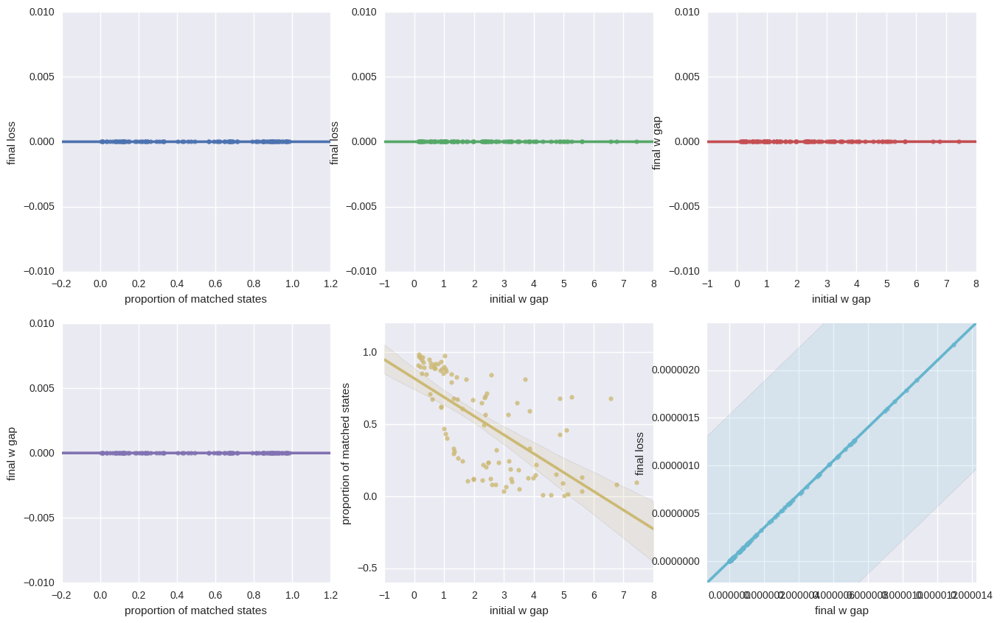

In [12]:
generate_all_plots(all_prop_matched_states,all_final_loss,all_final_w_gaps,all_initial_w_gaps)

100/100, 100/100 (369.73 s elapsed)

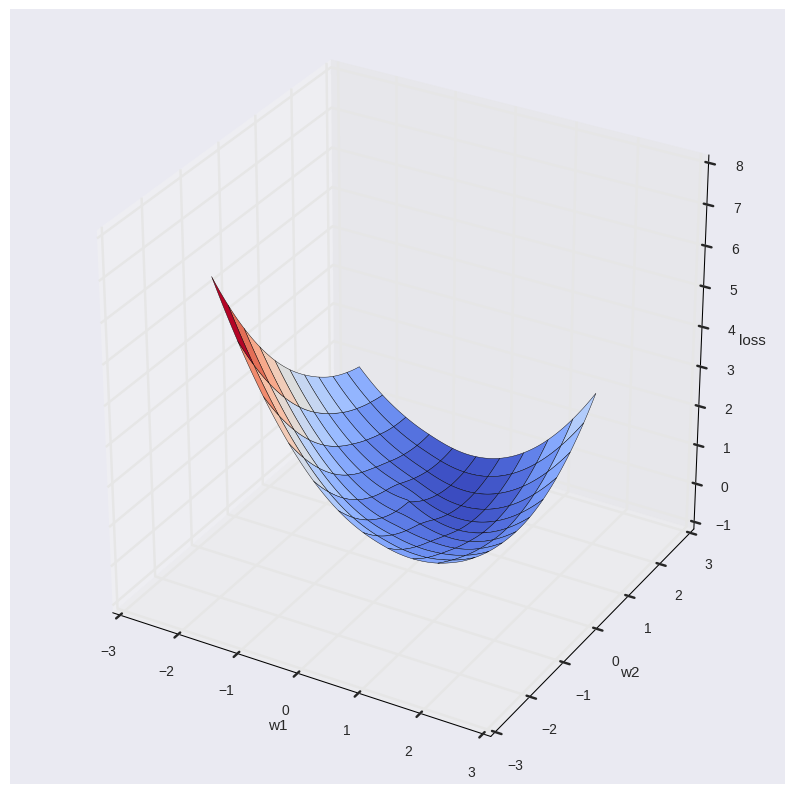

In [41]:
# %matplotlib notebook
# Generate 3D plot
n = 100
all_wi = np.linspace(-2,2,n)
all_wj = np.linspace(-2,2,n)
L = compute_L(X,Y,all_wi,all_wj,input_dict)
plot_L_3D(all_wi,all_wj,L,w['weights'][0],w['weights'][1],0)

In [14]:
# Parameters
p = 3    # number of dimensions
N = 1000  # number of samples
q = 3    # rank of covariance matrix for generating samples
h = 1     # number of hidden units

input_dict = dict(p=p,h=h)
X,Y,hs,w = generate_data(N,q,input_dict,seed=0,build_func=mlp_simple)
print(generate_loss(X,Y,w,build_func=mlp_simple)) # Check to make sure optimal loss is 0

all_prop_matched_states,all_final_loss,all_final_w_gaps,all_initial_w_gaps = \
    run_experiment(X,Y,hs,w,input_dict,100,build_func=mlp_simple,plot=False)

0.0
Epoch 200/200 (2.593 s), batch 10.0/10 (0.008 s): loss 0.003, w gap: 0.123
Done with 1/100 (2.64 s elapsed)
Epoch 200/200 (2.575 s), batch 10.0/10 (0.009 s): loss 0.002, w gap: 0.054
Done with 2/100 (5.26 s elapsed)
Epoch 200/200 (2.598 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.007
Done with 3/100 (7.91 s elapsed)
Epoch 200/200 (2.695 s), batch 10.0/10 (0.009 s): loss 0.003, w gap: 0.112
Done with 4/100 (10.65 s elapsed)
Epoch 200/200 (2.623 s), batch 10.0/10 (0.008 s): loss 0.001, w gap: 0.026
Done with 5/100 (13.33 s elapsed)
Epoch 200/200 (2.618 s), batch 10.0/10 (0.009 s): loss 0.005, w gap: 0.196
Done with 6/100 (16.00 s elapsed)
Epoch 200/200 (2.617 s), batch 10.0/10 (0.008 s): loss 0.001, w gap: 0.031
Done with 7/100 (18.66 s elapsed)
Epoch 200/200 (2.841 s), batch 10.0/10 (0.009 s): loss 0.003, w gap: 0.125
Done with 8/100 (21.56 s elapsed)
Epoch 200/200 (2.614 s), batch 10.0/10 (0.010 s): loss 0.000, w gap: 0.013
Done with 9/100 (24.22 s elapsed)
Epoch 200/200 (2.6

Epoch 31/200 (0.363 s), batch 4.0/10 (0.004 s): loss 0.029, w gap: 0.439

Epoch 43/200 (0.505 s), batch 10.0/10 (0.010 s): loss 0.014, w gap: 0.358

Epoch 60/200 (0.772 s), batch 10.0/10 (0.011 s): loss 0.011, w gap: 0.284

Epoch 76/200 (0.972 s), batch 7.0/10 (0.005 s): loss 0.007, w gap: 0.235

Epoch 91/200 (1.168 s), batch 10.0/10 (0.008 s): loss 0.006, w gap: 0.196

Epoch 107/200 (1.375 s), batch 2.0/10 (0.001 s): loss 0.004, w gap: 0.165

Epoch 121/200 (1.575 s), batch 10.0/10 (0.007 s): loss 0.005, w gap: 0.139

Epoch 136/200 (1.779 s), batch 10.0/10 (0.008 s): loss 0.004, w gap: 0.117

Epoch 151/200 (1.986 s), batch 1.0/10 (0.001 s): loss 0.003, w gap: 0.100

Epoch 164/200 (2.186 s), batch 4.0/10 (0.004 s): loss 0.003, w gap: 0.086

Epoch 177/200 (2.386 s), batch 10.0/10 (0.008 s): loss 0.002, w gap: 0.074

Epoch 191/200 (2.594 s), batch 4.0/10 (0.004 s): loss 0.002, w gap: 0.064

Epoch 200/200 (2.741 s), batch 10.0/10 (0.007 s): loss 0.002, w gap: 0.057
Done with 75/100 (203.38 s elapsed)
Epoch 200/200 (2.625 s), batch 10.0/10 (0.008 s): loss 0.001, w gap: 0.062
Done with 76/100 (206.06 s elapsed)
Epoch 200/200 (2.581 s), batch 10.0/10 (0.010 s): loss 0.003, w gap: 0.128
Done with 77/100 (208.69 s elapsed)
Epoch 200/200 (2.633 s), batch 10.0/10 (0.011 s): loss 0.009, w gap: 0.296
Done with 78/100 (211.38 s elapsed)
Epoch 200/200 (2.585 s), batch 10.0/10 (0.006 s): loss 0.001, w gap: 0.020
Done with 79/100 (214.09 s elapsed)
Epoch 200/200 (2.643 s), batch 10.0/10 (0.010 s): loss 0.000, w gap: 0.001
Done with 80/100 (216.79 s elapsed)
Epoch 200/200 (2.628 s), batch 10.0/10 (0.008 s): loss 0.005, w gap: 0.189
Done with 81/100 (219.47 s elapsed)
Epoch 200/200 (2.827 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.014
Done with 82/100 (222.35 s elapsed)
Epoch 200/200 (2.589 s), batch 10.0/10 (0.007 s): loss 0.004, w gap: 0.117
Done with 83/100 (224.99 s elapsed)
E

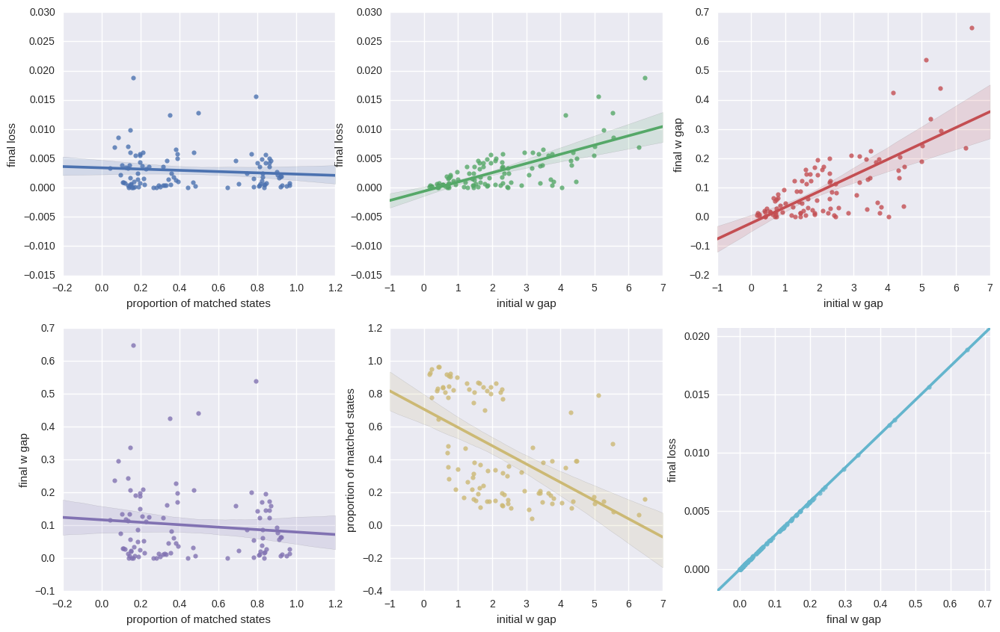

In [15]:
generate_all_plots(all_prop_matched_states,all_final_loss,all_final_w_gaps,all_initial_w_gaps)

In [43]:
# Parameters
p = 3    # number of dimensions
N = 1000  # number of samples
q = 3    # rank of covariance matrix for generating samples
h = 1     # number of hidden units

input_dict = dict(p=p,h=h)
X,Y,hs,w = generate_data(N,q,input_dict,seed=0,build_func=mlp_simple)
print(generate_loss(X,Y,w,build_func=mlp_simple)) # Check to make sure optimal loss is 0

all_prop_matched_states,all_final_loss,all_final_w_gaps,all_initial_w_gaps = \
    run_experiment(X,Y,hs,w,input_dict,100,build_func=mlp_simple,plot=False,num_epochs=1000)

0.0


Epoch 32/1000 (0.364 s), batch 10.0/10 (0.008 s): loss 0.024, w gap: 0.847

Epoch 50/1000 (0.570 s), batch 5.0/10 (0.004 s): loss 0.023, w gap: 0.688

Epoch 66/1000 (0.768 s), batch 10.0/10 (0.008 s): loss 0.016, w gap: 0.569

Epoch 83/1000 (0.973 s), batch 1.0/10 (0.002 s): loss 0.011, w gap: 0.473

Epoch 98/1000 (1.174 s), batch 1.0/10 (0.001 s): loss 0.013, w gap: 0.398

Epoch 113/1000 (1.375 s), batch 1.0/10 (0.001 s): loss 0.008, w gap: 0.335

Epoch 127/1000 (1.575 s), batch 6.0/10 (0.005 s): loss 0.011, w gap: 0.283

Epoch 141/1000 (1.777 s), batch 5.0/10 (0.006 s): loss 0.007, w gap: 0.241

Epoch 155/1000 (1.978 s), batch 5.0/10 (0.003 s): loss 0.006, w gap: 0.205

Epoch 169/1000 (2.178 s), batch 5.0/10 (0.004 s): loss 0.006, w gap: 0.175

Epoch 181/1000 (2.374 s), batch 10.0/10 (0.009 s): loss 0.005, w gap: 0.152

Epoch 194/1000 (2.578 s), batch 10.0/10 (0.008 s): loss 0.005, w gap: 0.131

Epoch 208/1000 (2.786 s), batch 2.0/10 (0.002 s): loss 0.003, w gap: 0.113

Epoch 220/1000 (2.987 s), batch 5.0/10 (0.005 s): loss 0.003, w gap: 0.099

Epoch 232/1000 (3.189 s), batch 8.0/10 (0.006 s): loss 0.003, w gap: 0.086

Epoch 244/1000 (3.388 s), batch 8.0/10 (0.006 s): loss 0.002, w gap: 0.075

Epoch 255/1000 (3.587 s), batch 10.0/10 (0.010 s): loss 0.001, w gap: 0.066

Epoch 267/1000 (3.793 s), batch 10.0/10 (0.007 s): loss 0.002, w gap: 0.058

Epoch 279/1000 (4.001 s), batch 8.0/10 (0.005 s): loss 0.001, w gap: 0.051

Epoch 290/1000 (4.199 s), batch 10.0/10 (0.006 s): loss 0.001, w gap: 0.045

Epoch 302/1000 (4.410 s), batch 3.0/10 (0.002 s): loss 0.001, w gap: 0.040

Epoch 313/1000 (4.610 s), batch 3.0/10 (0.002 s): loss 0.001, w gap: 0.035

Epoch 1000/1000 (24.616 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.000
Done with 1/100 (24.72 s elapsed)
Epoch 1000/1000 (26.478 s), batch 10.0/10 (0.010 s): loss 0.000, w gap: 0.000
Done with 2/100 (51.34 s elapsed)
Epoch 1000/1000 (26.042 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.000
Done with 3/100 (77.53 s elapsed)
Epoch 1000/1000 (25.599 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.000
Done with 4/100 (103.27 s elapsed)
Epoch 1000/1000 (28.275 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.000
Done with 5/100 (131.70 s elapsed)
Epoch 1000/1000 (28.532 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.000
Done with 6/100 (160.38 s elapsed)
Epoch 1000/1000 (27.687 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.000
Done with 7/100 (188.21 s elapsed)
Epoch 1000/1000 (26.853 s), batch 10.0/10 (0.010 s): loss 0.000, w gap: 0.000
Done with 8/100 (215.21 s elapsed)
Epoch 1000/1000 (26.229 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.000
Done with 9/100 (241.

Epoch 1000/1000 (25.363 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.000
Done with 72/100 (1923.52 s elapsed)
Epoch 1000/1000 (27.146 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.000
Done with 73/100 (1950.88 s elapsed)
Epoch 1000/1000 (28.069 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.000
Done with 74/100 (1979.09 s elapsed)
Epoch 1000/1000 (27.460 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.000
Done with 75/100 (2006.69 s elapsed)
Epoch 1000/1000 (26.827 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.000
Done with 76/100 (2033.65 s elapsed)
Epoch 1000/1000 (26.075 s), batch 10.0/10 (0.012 s): loss 0.000, w gap: 0.000
Done with 77/100 (2059.86 s elapsed)
Epoch 1000/1000 (25.519 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.000
Done with 78/100 (2085.51 s elapsed)
Epoch 1000/1000 (24.675 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.000
Done with 79/100 (2110.31 s elapsed)
Epoch 1000/1000 (27.633 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.000
Do

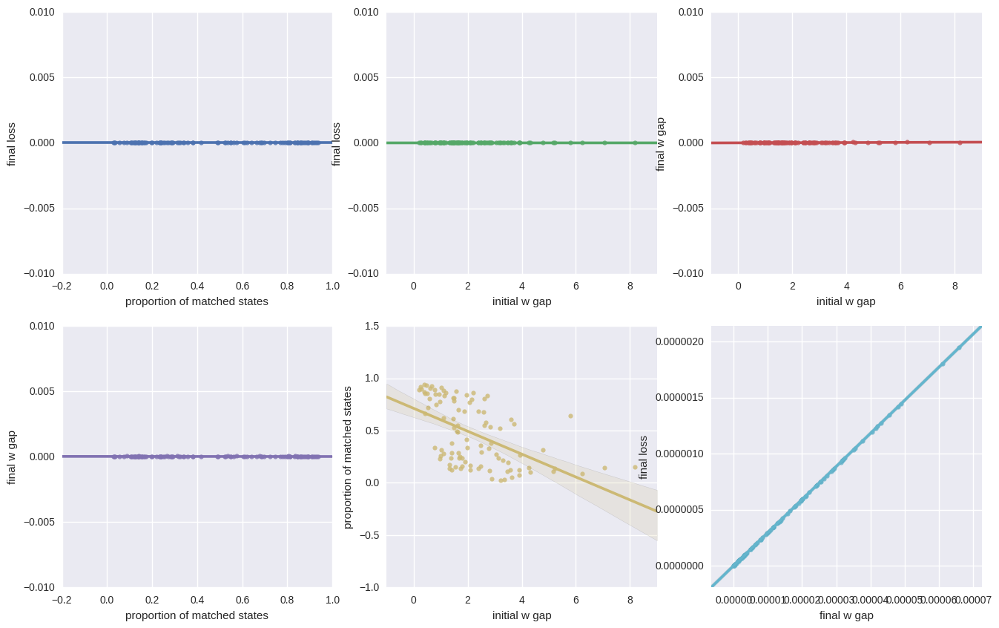

In [44]:
generate_all_plots(all_prop_matched_states,all_final_loss,all_final_w_gaps,all_initial_w_gaps)

In [16]:
# Parameters
p = 10    # number of dimensions
N = 1000  # number of samples
q = 10    # rank of covariance matrix for generating samples
h = 1     # number of hidden units

input_dict = dict(p=p,h=h)
X,Y,hs,w = generate_data(N,q,input_dict,seed=0,build_func=mlp_simple)
print(generate_loss(X,Y,w,build_func=mlp_simple)) # Check to make sure optimal loss is 0

all_prop_matched_states,all_final_loss,all_final_w_gaps,all_initial_w_gaps = \
    run_experiment(X,Y,hs,w,input_dict,100,build_func=mlp_simple,plot=False)

0.0


Epoch 32/200 (0.366 s), batch 10.0/10 (0.008 s): loss 0.017, w gap: 0.286

Epoch 50/200 (0.570 s), batch 9.0/10 (0.007 s): loss 0.008, w gap: 0.201

Epoch 67/200 (0.772 s), batch 8.0/10 (0.008 s): loss 0.006, w gap: 0.154

Epoch 83/200 (0.973 s), batch 3.0/10 (0.002 s): loss 0.004, w gap: 0.127

Epoch 98/200 (1.174 s), batch 9.0/10 (0.006 s): loss 0.002, w gap: 0.110

Epoch 113/200 (1.375 s), batch 8.0/10 (0.006 s): loss 0.001, w gap: 0.100

Epoch 128/200 (1.574 s), batch 10.0/10 (0.007 s): loss 0.001, w gap: 0.093

Epoch 143/200 (1.781 s), batch 1.0/10 (0.001 s): loss 0.001, w gap: 0.088

Epoch 157/200 (1.980 s), batch 2.0/10 (0.001 s): loss 0.000, w gap: 0.085

Epoch 170/200 (2.181 s), batch 6.0/10 (0.005 s): loss 0.000, w gap: 0.082

Epoch 184/200 (2.383 s), batch 1.0/10 (0.001 s): loss 0.000, w gap: 0.080

Epoch 196/200 (2.579 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.079

Epoch 200/200 (2.645 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.079
Done with 1/100 (2.70 s elapsed)
Epoch 200/200 (2.619 s), batch 10.0/10 (0.009 s): loss 0.001, w gap: 0.428
Done with 2/100 (5.40 s elapsed)
Epoch 200/200 (2.666 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.961
Done with 3/100 (8.15 s elapsed)
Epoch 200/200 (2.603 s), batch 10.0/10 (0.008 s): loss 0.001, w gap: 0.134
Done with 4/100 (10.80 s elapsed)
Epoch 200/200 (2.608 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.038
Done with 5/100 (13.48 s elapsed)
Epoch 200/200 (2.693 s), batch 10.0/10 (0.010 s): loss 0.000, w gap: 0.463
Done with 6/100 (16.23 s elapsed)
Epoch 200/200 (2.621 s), batch 10.0/10 (0.008 s): loss 0.001, w gap: 0.403
Done with 7/100 (18.90 s elapsed)
Epoch 200/200 (2.648 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.193
Done with 8/100 (21.60 s elapsed)
Epoch 200/200 (2.622 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.527
Done with 9/100 (24.28 s elapsed)
Epoch 200/200 (2.868 s

Epoch 31/200 (0.352 s), batch 10.0/10 (0.008 s): loss 0.025, w gap: 0.458

Epoch 48/200 (0.553 s), batch 10.0/10 (0.007 s): loss 0.016, w gap: 0.324

Epoch 65/200 (0.755 s), batch 10.0/10 (0.007 s): loss 0.007, w gap: 0.266

Epoch 82/200 (0.961 s), batch 2.0/10 (0.001 s): loss 0.002, w gap: 0.242

Epoch 98/200 (1.161 s), batch 9.0/10 (0.008 s): loss 0.001, w gap: 0.230

Epoch 113/200 (1.360 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.225

Epoch 128/200 (1.562 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.223

Epoch 143/200 (1.768 s), batch 7.0/10 (0.004 s): loss 0.000, w gap: 0.222

Epoch 157/200 (1.970 s), batch 5.0/10 (0.004 s): loss 0.000, w gap: 0.221

Epoch 170/200 (2.170 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.221

Epoch 184/200 (2.374 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.221

Epoch 198/200 (2.582 s), batch 1.0/10 (0.001 s): loss 0.000, w gap: 0.220

Epoch 200/200 (2.624 s), batch 10.0/10 (0.010 s): loss 0.000, w gap: 0.220
Done with 75/100 (204.38 s elapsed)


Epoch 28/200 (0.310 s), batch 3.0/10 (0.002 s): loss 0.063, w gap: 0.561

Epoch 45/200 (0.511 s), batch 10.0/10 (0.007 s): loss 0.025, w gap: 0.336

Epoch 61/200 (0.715 s), batch 10.0/10 (0.013 s): loss 0.009, w gap: 0.224

Epoch 78/200 (0.916 s), batch 10.0/10 (0.008 s): loss 0.008, w gap: 0.154

Epoch 94/200 (1.121 s), batch 8.0/10 (0.007 s): loss 0.003, w gap: 0.115

Epoch 109/200 (1.319 s), batch 10.0/10 (0.007 s): loss 0.003, w gap: 0.091

Epoch 124/200 (1.525 s), batch 10.0/10 (0.007 s): loss 0.002, w gap: 0.076

Epoch 139/200 (1.730 s), batch 10.0/10 (0.009 s): loss 0.002, w gap: 0.065

Epoch 154/200 (1.937 s), batch 2.0/10 (0.002 s): loss 0.001, w gap: 0.057

Epoch 168/200 (2.139 s), batch 6.0/10 (0.004 s): loss 0.001, w gap: 0.051

Epoch 181/200 (2.339 s), batch 10.0/10 (0.011 s): loss 0.001, w gap: 0.047

Epoch 195/200 (2.546 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.043

Epoch 200/200 (2.626 s), batch 10.0/10 (0.008 s): loss 0.001, w gap: 0.042
Done with 76/100 (207.06 s elapsed)
Epoch 200/200 (2.778 s), batch 10.0/10 (0.010 s): loss 0.000, w gap: 0.157
Done with 77/100 (209.89 s elapsed)
Epoch 200/200 (2.654 s), batch 10.0/10 (0.011 s): loss 0.001, w gap: 0.100
Done with 78/100 (212.59 s elapsed)
Epoch 200/200 (2.649 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.044
Done with 79/100 (215.30 s elapsed)
Epoch 200/200 (2.664 s), batch 10.0/10 (0.010 s): loss 0.001, w gap: 1.168
Done with 80/100 (218.01 s elapsed)
Epoch 200/200 (2.598 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.006
Done with 81/100 (220.72 s elapsed)
Epoch 200/200 (2.657 s), batch 10.0/10 (0.010 s): loss 0.001, w gap: 0.139
Done with 82/100 (223.43 s elapsed)
Epoch 200/200 (2.631 s), batch 10.0/10 (0.007 s): loss 0.001, w gap: 0.100
Done with 83/100 (226.12 s elapsed)
Epoch 200/200 (2.789 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.324
Done with 84/100 (228.96 s elapsed)
E

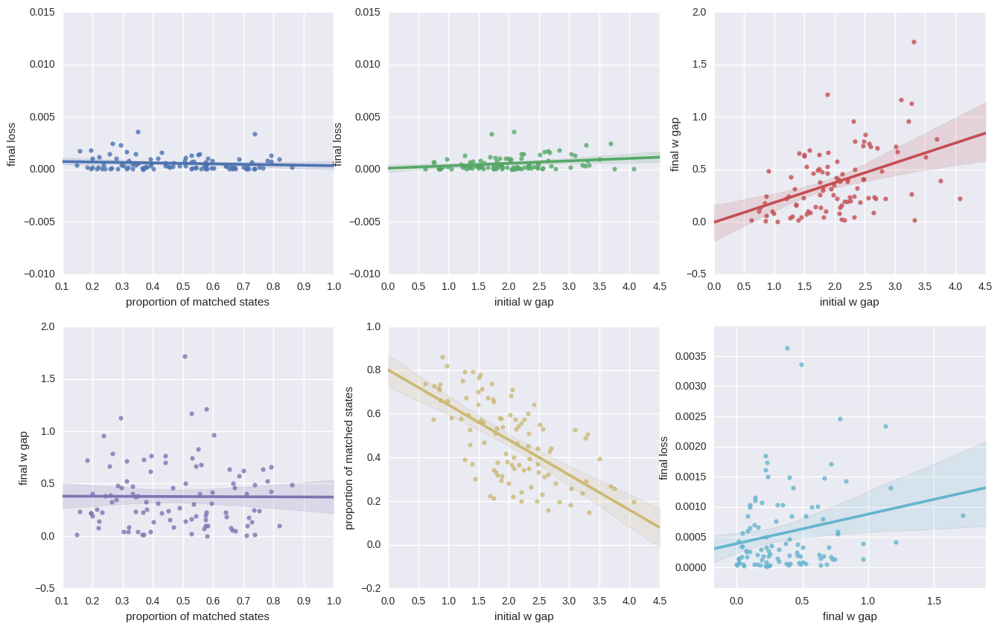

In [17]:
generate_all_plots(all_prop_matched_states,all_final_loss,all_final_w_gaps,all_initial_w_gaps)

In [18]:
# Parameters
p = 10    # number of dimensions
N = 10000 # number of samples
q = 10    # rank of covariance matrix for generating samples
h = 1     # number of hidden units

input_dict = dict(p=p,h=h)
X,Y,hs,w = generate_data(N,q,input_dict,seed=0,build_func=mlp_simple)
print(generate_loss(X,Y,w,build_func=mlp_simple)) # Check to make sure optimal loss is 0

all_prop_matched_states,all_final_loss,all_final_w_gaps,all_initial_w_gaps = \
    run_experiment(X,Y,hs,w,input_dict,100,build_func=mlp_simple,plot=False)

0.0
Epoch 200/200 (16.748 s), batch 100.0/100 (0.075 s): loss 0.000, w gap: 0.046
Done with 1/100 (16.86 s elapsed)
Epoch 200/200 (16.696 s), batch 100.0/100 (0.083 s): loss 0.000, w gap: 0.116
Done with 2/100 (33.69 s elapsed)
Epoch 200/200 (16.839 s), batch 100.0/100 (0.080 s): loss 0.000, w gap: 0.078
Done with 3/100 (50.64 s elapsed)
Epoch 200/200 (16.609 s), batch 100.0/100 (0.073 s): loss 0.000, w gap: 1.215
Done with 4/100 (67.38 s elapsed)
Epoch 200/200 (16.860 s), batch 100.0/100 (0.076 s): loss 0.000, w gap: 0.079
Done with 5/100 (84.36 s elapsed)
Epoch 200/200 (16.718 s), batch 100.0/100 (0.081 s): loss 0.000, w gap: 0.009
Done with 6/100 (101.20 s elapsed)
Epoch 200/200 (16.768 s), batch 100.0/100 (0.075 s): loss 0.000, w gap: 0.006
Done with 7/100 (118.09 s elapsed)
Epoch 200/200 (16.905 s), batch 100.0/100 (0.080 s): loss 0.000, w gap: 0.395
Done with 8/100 (135.12 s elapsed)
Epoch 200/200 (16.672 s), batch 100.0/100 (0.079 s): loss 0.000, w gap: 0.232
Done with 9/100 (15

Epoch 3/200 (0.256 s), batch 47.0/100 (0.037 s): loss 0.011, w gap: 1.319

Epoch 5/200 (0.456 s), batch 100.0/100 (0.075 s): loss 0.004, w gap: 1.252

Epoch 8/200 (0.660 s), batch 50.0/100 (0.041 s): loss 0.002, w gap: 1.224

Epoch 10/200 (0.861 s), batch 91.0/100 (0.069 s): loss 0.001, w gap: 1.212

Epoch 13/200 (1.063 s), batch 43.0/100 (0.037 s): loss 0.000, w gap: 1.205

Epoch 15/200 (1.263 s), batch 100.0/100 (0.075 s): loss 0.000, w gap: 1.202

Epoch 18/200 (1.467 s), batch 48.0/100 (0.031 s): loss 0.000, w gap: 1.200

Epoch 20/200 (1.668 s), batch 91.0/100 (0.070 s): loss 0.000, w gap: 1.199

Epoch 23/200 (1.868 s), batch 39.0/100 (0.033 s): loss 0.000, w gap: 1.198

Epoch 25/200 (2.070 s), batch 93.0/100 (0.072 s): loss 0.000, w gap: 1.197

Epoch 28/200 (2.271 s), batch 26.0/100 (0.019 s): loss 0.000, w gap: 1.196

Epoch 30/200 (2.471 s), batch 79.0/100 (0.066 s): loss 0.000, w gap: 1.196

Epoch 33/200 (2.672 s), batch 23.0/100 (0.018 s): loss 0.000, w gap: 1.195

Epoch 35/200 (2.873 s), batch 72.0/100 (0.060 s): loss 0.000, w gap: 1.195

Epoch 38/200 (3.074 s), batch 12.0/100 (0.011 s): loss 0.000, w gap: 1.194

Epoch 40/200 (3.275 s), batch 74.0/100 (0.056 s): loss 0.000, w gap: 1.193

Epoch 43/200 (3.476 s), batch 26.0/100 (0.021 s): loss 0.000, w gap: 1.193

Epoch 45/200 (3.676 s), batch 80.0/100 (0.069 s): loss 0.000, w gap: 1.192

Epoch 48/200 (3.878 s), batch 29.0/100 (0.021 s): loss 0.000, w gap: 1.192

Epoch 50/200 (4.079 s), batch 83.0/100 (0.066 s): loss 0.000, w gap: 1.191

Epoch 53/200 (4.279 s), batch 39.0/100 (0.028 s): loss 0.000, w gap: 1.191

Epoch 55/200 (4.480 s), batch 88.0/100 (0.070 s): loss 0.000, w gap: 1.191

Epoch 58/200 (4.681 s), batch 30.0/100 (0.023 s): loss 0.000, w gap: 1.190

Epoch 60/200 (4.882 s), batch 79.0/100 (0.058 s): loss 0.000, w gap: 1.190

Epoch 63/200 (5.083 s), batch 15.0/100 (0.011 s): loss 0.000, w gap: 1.189

Epoch 65/200 (5.283 s), batch 64.0/100 (0.050 s): loss 0.000, w gap: 1.189

Epoch 68/200 (5.484 s), batch 4.0/100 (0.003 s): loss 0.000, w gap: 1.189

Epoch 70/200 (5.685 s), batch 45.0/100 (0.037 s): loss 0.000, w gap: 1.188

Epoch 72/200 (5.885 s), batch 84.0/100 (0.067 s): loss 0.000, w gap: 1.188

Epoch 75/200 (6.087 s), batch 12.0/100 (0.010 s): loss 0.000, w gap: 1.188

Epoch 77/200 (6.287 s), batch 53.0/100 (0.044 s): loss 0.000, w gap: 1.187

Epoch 79/200 (6.488 s), batch 96.0/100 (0.071 s): loss 0.000, w gap: 1.187

Epoch 82/200 (6.689 s), batch 38.0/100 (0.027 s): loss 0.000, w gap: 1.187

Epoch 84/200 (6.891 s), batch 73.0/100 (0.060 s): loss 0.000, w gap: 1.186

Epoch 87/200 (7.092 s), batch 20.0/100 (0.014 s): loss 0.000, w gap: 1.186

Epoch 89/200 (7.293 s), batch 76.0/100 (0.058 s): loss 0.000, w gap: 1.186

Epoch 92/200 (7.494 s), batch 20.0/100 (0.015 s): loss 0.000, w gap: 1.185

Epoch 94/200 (7.695 s), batch 55.0/100 (0.047 s): loss 0.000, w gap: 1.185

Epoch 96/200 (7.895 s), batch 90.0/100 (0.072 s): loss 0.000, w gap: 1.185

Epoch 99/200 (8.096 s), batch 32.0/100 (0.025 s): loss 0.000, w gap: 1.184

Epoch 101/200 (8.297 s), batch 75.0/100 (0.058 s): loss 0.000, w gap: 1.184

Epoch 104/200 (8.498 s), batch 29.0/100 (0.021 s): loss 0.000, w gap: 1.184

Epoch 106/200 (8.698 s), batch 77.0/100 (0.053 s): loss 0.000, w gap: 1.183

Epoch 109/200 (8.900 s), batch 8.0/100 (0.007 s): loss 0.000, w gap: 1.183

Epoch 111/200 (9.101 s), batch 43.0/100 (0.037 s): loss 0.000, w gap: 1.183

Epoch 113/200 (9.302 s), batch 88.0/100 (0.064 s): loss 0.000, w gap: 1.182

Epoch 116/200 (9.503 s), batch 36.0/100 (0.026 s): loss 0.000, w gap: 1.182

Epoch 118/200 (9.703 s), batch 83.0/100 (0.066 s): loss 0.000, w gap: 1.182

Epoch 121/200 (9.905 s), batch 19.0/100 (0.018 s): loss 0.000, w gap: 1.181

Epoch 123/200 (10.106 s), batch 51.0/100 (0.045 s): loss 0.000, w gap: 1.181

Epoch 125/200 (10.302 s), batch 100.0/100 (0.074 s): loss 0.000, w gap: 1.181

Epoch 128/200 (10.509 s), batch 36.0/100 (0.026 s): loss 0.000, w gap: 1.181

Epoch 130/200 (10.710 s), batch 79.0/100 (0.058 s): loss 0.000, w gap: 1.180

Epoch 133/200 (10.911 s), batch 13.0/100 (0.010 s): loss 0.000, w gap: 1.180

Epoch 135/200 (11.112 s), batch 48.0/100 (0.037 s): loss 0.000, w gap: 1.180

Epoch 137/200 (11.313 s), batch 95.0/100 (0.074 s): loss 0.000, w gap: 1.179

Epoch 140/200 (11.513 s), batch 11.0/100 (0.010 s): loss 0.000, w gap: 1.179

Epoch 142/200 (11.715 s), batch 46.0/100 (0.034 s): loss 0.000, w gap: 1.179

Epoch 144/200 (11.914 s), batch 75.0/100 (0.062 s): loss 0.000, w gap: 1.179

Epoch 146/200 (12.111 s), batch 100.0/100 (0.082 s): loss 0.000, w gap: 1.178

Epoch 149/200 (12.319 s), batch 44.0/100 (0.034 s): loss 0.000, w gap: 1.178

Epoch 151/200 (12.520 s), batch 71.0/100 (0.057 s): loss 0.000, w gap: 1.178

Epoch 153/200 (12.721 s), batch 93.0/100 (0.078 s): loss 0.000, w gap: 1.177

Epoch 156/200 (12.923 s), batch 32.0/100 (0.024 s): loss 0.000, w gap: 1.177

Epoch 158/200 (13.124 s), batch 78.0/100 (0.061 s): loss 0.000, w gap: 1.177

Epoch 161/200 (13.325 s), batch 9.0/100 (0.007 s): loss 0.000, w gap: 1.176

Epoch 163/200 (13.525 s), batch 56.0/100 (0.044 s): loss 0.000, w gap: 1.176

Epoch 165/200 (13.725 s), batch 100.0/100 (0.076 s): loss 0.000, w gap: 1.176

Epoch 168/200 (13.933 s), batch 53.0/100 (0.043 s): loss 0.000, w gap: 1.176

Epoch 170/200 (14.134 s), batch 92.0/100 (0.071 s): loss 0.000, w gap: 1.175

Epoch 173/200 (14.335 s), batch 14.0/100 (0.009 s): loss 0.000, w gap: 1.175

Epoch 175/200 (14.535 s), batch 56.0/100 (0.043 s): loss 0.000, w gap: 1.175

Epoch 177/200 (14.736 s), batch 99.0/100 (0.075 s): loss 0.000, w gap: 1.174

Epoch 180/200 (14.938 s), batch 24.0/100 (0.019 s): loss 0.000, w gap: 1.174

Epoch 182/200 (15.138 s), batch 53.0/100 (0.043 s): loss 0.000, w gap: 1.174

Epoch 184/200 (15.340 s), batch 98.0/100 (0.074 s): loss 0.000, w gap: 1.174

Epoch 187/200 (15.541 s), batch 28.0/100 (0.023 s): loss 0.000, w gap: 1.173

Epoch 189/200 (15.742 s), batch 51.0/100 (0.046 s): loss 0.000, w gap: 1.173

Epoch 191/200 (15.942 s), batch 84.0/100 (0.066 s): loss 0.000, w gap: 1.173

Epoch 194/200 (16.144 s), batch 17.0/100 (0.014 s): loss 0.000, w gap: 1.172

Epoch 196/200 (16.345 s), batch 62.0/100 (0.048 s): loss 0.000, w gap: 1.172

Epoch 198/200 (16.542 s), batch 100.0/100 (0.074 s): loss 0.000, w gap: 1.172

Epoch 200/200 (16.706 s), batch 100.0/100 (0.077 s): loss 0.000, w gap: 1.172


Done with 73/100 (1235.46 s elapsed)


Epoch 5/200 (0.449 s), batch 94.0/100 (0.079 s): loss 0.001, w gap: 0.079

Epoch 8/200 (0.650 s), batch 48.0/100 (0.037 s): loss 0.001, w gap: 0.069

Epoch 10/200 (0.851 s), batch 95.0/100 (0.072 s): loss 0.001, w gap: 0.062

Epoch 13/200 (1.052 s), batch 44.0/100 (0.036 s): loss 0.000, w gap: 0.056

Epoch 15/200 (1.252 s), batch 100.0/100 (0.081 s): loss 0.001, w gap: 0.051

Epoch 18/200 (1.456 s), batch 45.0/100 (0.036 s): loss 0.001, w gap: 0.046

Epoch 21/200 (1.658 s), batch 3.0/100 (0.003 s): loss 0.000, w gap: 0.041

Epoch 23/200 (1.858 s), batch 60.0/100 (0.047 s): loss 0.000, w gap: 0.037

Epoch 26/200 (2.059 s), batch 3.0/100 (0.002 s): loss 0.000, w gap: 0.034

Epoch 28/200 (2.261 s), batch 45.0/100 (0.034 s): loss 0.000, w gap: 0.031

Epoch 30/200 (2.462 s), batch 94.0/100 (0.071 s): loss 0.000, w gap: 0.028

Epoch 33/200 (2.662 s), batch 44.0/100 (0.032 s): loss 0.000, w gap: 0.025

Epoch 35/200 (2.862 s), batch 91.0/100 (0.073 s): loss 0.000, w gap: 0.023

Epoch 38/200 (3.064 s), batch 39.0/100 (0.028 s): loss 0.000, w gap: 0.021

Epoch 40/200 (3.265 s), batch 85.0/100 (0.063 s): loss 0.000, w gap: 0.019

Epoch 43/200 (3.466 s), batch 10.0/100 (0.009 s): loss 0.000, w gap: 0.018

Epoch 45/200 (3.667 s), batch 63.0/100 (0.046 s): loss 0.000, w gap: 0.016

Epoch 48/200 (3.868 s), batch 13.0/100 (0.011 s): loss 0.000, w gap: 0.014

Epoch 50/200 (4.069 s), batch 51.0/100 (0.041 s): loss 0.000, w gap: 0.013

Epoch 52/200 (4.270 s), batch 91.0/100 (0.072 s): loss 0.000, w gap: 0.012

Epoch 55/200 (4.471 s), batch 32.0/100 (0.024 s): loss 0.000, w gap: 0.011

Epoch 57/200 (4.672 s), batch 54.0/100 (0.045 s): loss 0.000, w gap: 0.010

Epoch 59/200 (4.873 s), batch 100.0/100 (0.075 s): loss 0.000, w gap: 0.009

Epoch 62/200 (5.078 s), batch 51.0/100 (0.040 s): loss 0.000, w gap: 0.009

Epoch 64/200 (5.278 s), batch 96.0/100 (0.078 s): loss 0.000, w gap: 0.008

Epoch 67/200 (5.480 s), batch 32.0/100 (0.031 s): loss 0.000, w gap: 0.007

Epoch 69/200 (5.681 s), batch 80.0/100 (0.059 s): loss 0.000, w gap: 0.007

Epoch 72/200 (5.882 s), batch 15.0/100 (0.012 s): loss 0.000, w gap: 0.006

Epoch 74/200 (6.082 s), batch 72.0/100 (0.055 s): loss 0.000, w gap: 0.006

Epoch 76/200 (6.283 s), batch 100.0/100 (0.082 s): loss 0.000, w gap: 0.005

Epoch 79/200 (6.489 s), batch 51.0/100 (0.042 s): loss 0.000, w gap: 0.005

Epoch 81/200 (6.690 s), batch 92.0/100 (0.074 s): loss 0.000, w gap: 0.005

Epoch 84/200 (6.891 s), batch 35.0/100 (0.027 s): loss 0.000, w gap: 0.004

Epoch 86/200 (7.092 s), batch 82.0/100 (0.066 s): loss 0.000, w gap: 0.004

Epoch 89/200 (7.293 s), batch 28.0/100 (0.022 s): loss 0.000, w gap: 0.004

Epoch 91/200 (7.494 s), batch 65.0/100 (0.054 s): loss 0.000, w gap: 0.003

Epoch 94/200 (7.695 s), batch 8.0/100 (0.008 s): loss 0.000, w gap: 0.003

Epoch 96/200 (7.896 s), batch 49.0/100 (0.041 s): loss 0.000, w gap: 0.003

Epoch 98/200 (8.097 s), batch 94.0/100 (0.070 s): loss 0.000, w gap: 0.003

Epoch 101/200 (8.298 s), batch 26.0/100 (0.021 s): loss 0.000, w gap: 0.003

Epoch 103/200 (8.499 s), batch 63.0/100 (0.051 s): loss 0.000, w gap: 0.003

Epoch 105/200 (8.700 s), batch 99.0/100 (0.079 s): loss 0.000, w gap: 0.002

Epoch 108/200 (8.902 s), batch 41.0/100 (0.031 s): loss 0.000, w gap: 0.002

Epoch 110/200 (9.103 s), batch 85.0/100 (0.066 s): loss 0.000, w gap: 0.002

Epoch 113/200 (9.304 s), batch 10.0/100 (0.007 s): loss 0.000, w gap: 0.002

Epoch 115/200 (9.504 s), batch 50.0/100 (0.041 s): loss 0.000, w gap: 0.002

Epoch 117/200 (9.705 s), batch 90.0/100 (0.065 s): loss 0.000, w gap: 0.002

Epoch 120/200 (9.905 s), batch 25.0/100 (0.018 s): loss 0.000, w gap: 0.002

Epoch 122/200 (10.107 s), batch 67.0/100 (0.052 s): loss 0.000, w gap: 0.002

Epoch 124/200 (10.307 s), batch 98.0/100 (0.078 s): loss 0.000, w gap: 0.002

Epoch 127/200 (10.509 s), batch 40.0/100 (0.029 s): loss 0.000, w gap: 0.002

Epoch 129/200 (10.710 s), batch 83.0/100 (0.065 s): loss 0.000, w gap: 0.002

Epoch 132/200 (10.911 s), batch 16.0/100 (0.013 s): loss 0.000, w gap: 0.002

Epoch 134/200 (11.112 s), batch 62.0/100 (0.045 s): loss 0.000, w gap: 0.002

Epoch 136/200 (11.313 s), batch 97.0/100 (0.081 s): loss 0.000, w gap: 0.002

Epoch 139/200 (11.514 s), batch 35.0/100 (0.025 s): loss 0.000, w gap: 0.001

Epoch 141/200 (11.715 s), batch 71.0/100 (0.058 s): loss 0.000, w gap: 0.001

Epoch 144/200 (11.915 s), batch 3.0/100 (0.005 s): loss 0.000, w gap: 0.001

Epoch 146/200 (12.117 s), batch 44.0/100 (0.038 s): loss 0.000, w gap: 0.001

Epoch 148/200 (12.318 s), batch 93.0/100 (0.068 s): loss 0.000, w gap: 0.001

Epoch 151/200 (12.518 s), batch 26.0/100 (0.022 s): loss 0.000, w gap: 0.001

Epoch 153/200 (12.720 s), batch 72.0/100 (0.058 s): loss 0.000, w gap: 0.001

Epoch 155/200 (12.920 s), batch 100.0/100 (0.084 s): loss 0.000, w gap: 0.001

Epoch 158/200 (13.127 s), batch 53.0/100 (0.038 s): loss 0.000, w gap: 0.001

Epoch 160/200 (13.328 s), batch 87.0/100 (0.068 s): loss 0.000, w gap: 0.001

Epoch 163/200 (13.528 s), batch 16.0/100 (0.014 s): loss 0.000, w gap: 0.001

Epoch 165/200 (13.730 s), batch 54.0/100 (0.044 s): loss 0.000, w gap: 0.001

Epoch 167/200 (13.930 s), batch 100.0/100 (0.075 s): loss 0.000, w gap: 0.001

Epoch 170/200 (14.138 s), batch 40.0/100 (0.030 s): loss 0.000, w gap: 0.001

Epoch 172/200 (14.339 s), batch 76.0/100 (0.064 s): loss 0.000, w gap: 0.001

Epoch 175/200 (14.539 s), batch 9.0/100 (0.006 s): loss 0.000, w gap: 0.001

Epoch 177/200 (14.741 s), batch 44.0/100 (0.037 s): loss 0.000, w gap: 0.001

Epoch 179/200 (14.941 s), batch 73.0/100 (0.057 s): loss 0.000, w gap: 0.001

Epoch 182/200 (15.141 s), batch 4.0/100 (0.003 s): loss 0.000, w gap: 0.001

Epoch 184/200 (15.342 s), batch 43.0/100 (0.033 s): loss 0.000, w gap: 0.001

Epoch 186/200 (15.544 s), batch 74.0/100 (0.063 s): loss 0.000, w gap: 0.001

Epoch 188/200 (15.741 s), batch 100.0/100 (0.078 s): loss 0.000, w gap: 0.001

Epoch 191/200 (15.950 s), batch 47.0/100 (0.038 s): loss 0.000, w gap: 0.001

Epoch 193/200 (16.151 s), batch 94.0/100 (0.071 s): loss 0.000, w gap: 0.001

Epoch 196/200 (16.351 s), batch 14.0/100 (0.010 s): loss 0.000, w gap: 0.001

Epoch 198/200 (16.553 s), batch 40.0/100 (0.031 s): loss 0.000, w gap: 0.001

Epoch 200/200 (16.754 s), batch 65.0/100 (0.053 s): loss 0.000, w gap: 0.001

Epoch 200/200 (16.780 s), batch 100.0/100 (0.079 s): loss 0.000, w gap: 0.001
Done with 74/100 (1252.42 s elapsed)
Epoch 200/200 (17.155 s), batch 100.0/100 (0.077 s): loss 0.000, w gap: 0.338
Done with 75/100 (1269.71 s elapsed)
Epoch 200/200 (16.726 s), batch 100.0/100 (0.079 s): loss 0.000, w gap: 1.816
Done with 76/100 (1286.55 s elapsed)
Epoch 200/200 (16.779 s), batch 100.0/100 (0.083 s): loss 0.000, w gap: 0.288
Done with 77/100 (1303.53 s elapsed)
Epoch 200/200 (16.824 s), batch 100.0/100 (0.073 s): loss 0.000, w gap: 0.011
Done with 78/100 (1320.48 s elapsed)
Epoch 200/200 (17.215 s), batch 100.0/100 (0.083 s): loss 0.000, w gap: 0.220
Done with 79/100 (1337.81 s elapsed)
Epoch 200/200 (16.685 s), batch 100.0/100 (0.076 s): loss 0.000, w gap: 0.012
Done with 80/100 (1354.68 s elapsed)
Epoch 200/200 (16.730 s), batch 100.0/100 (0.075 s): loss 0.000, w gap: 0.319
Done with 81/100 (1371.57 s elapsed)
Epoch 200/200 (16.839 s), batch 100.0/100 (0.076 s): loss 0.000, w gap: 0.025
Do

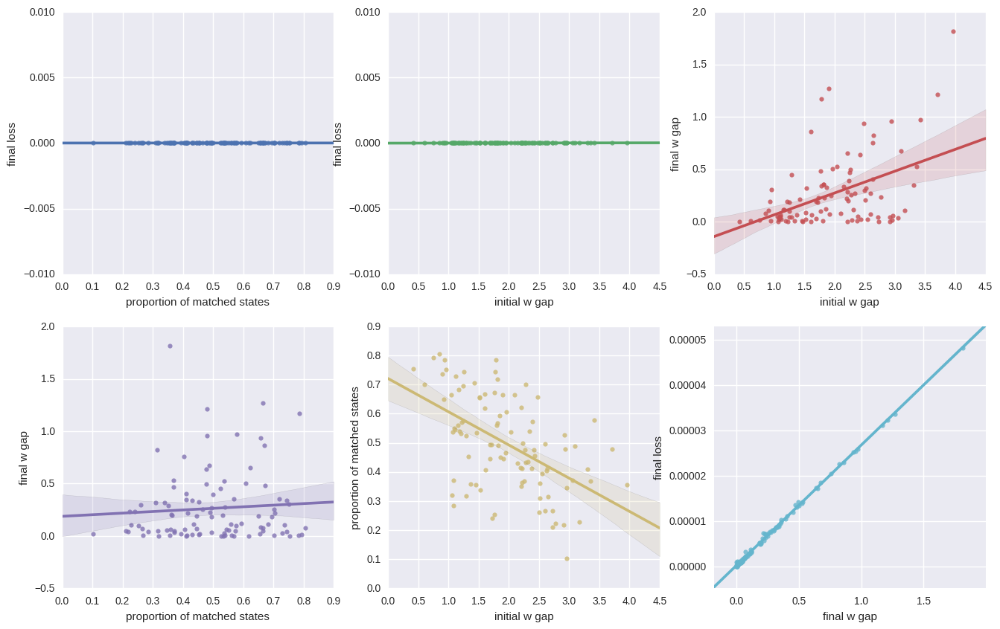

In [19]:
generate_all_plots(all_prop_matched_states,all_final_loss,all_final_w_gaps,all_initial_w_gaps)

### Experiment 3

Repeat experiment with no relu at last layer and fixed weights at last layer (3-layer)

In [47]:
def mlp_exp3(input_dict):
    p = input_dict['p']
    h = input_dict['h']
    mlp_in = tf.placeholder(tf.float32, shape=[None, p])
    weights1 = tf.get_variable('w1',initializer=tf.random_normal(shape=[p,h],
                                                                 stddev=1./np.sqrt(p)))
    mlp_hidden = tf.nn.relu(tf.matmul(mlp_in, weights1), name='mlp_hidden')
    weights2 = tf.get_variable('w2',initializer=tf.random_normal(shape=[h,1],
                                                                 stddev=1./np.sqrt(h)))#,trainable=False)
    mlp_out = tf.matmul(mlp_hidden, weights2)
    return dict(x=mlp_in,yhat=mlp_out,hid=mlp_hidden,weights1=weights1,weights2=weights2)

In [50]:
# Parameters
p = 10    # number of dimensions
N = 1000  # number of samples
q = 10    # rank of covariance matrix for generating samples
h = 3     # number of hidden units

input_dict = dict(p=p,h=h)
X,Y,hs,w = generate_data(N,q,input_dict,seed=0,build_func=mlp_exp3)
print(generate_loss(X,Y,w,build_func=mlp_exp3)) # Check to make sure optimal loss is 0

all_prop_matched_states,all_final_loss,all_final_w_gaps,all_initial_w_gaps,all_weights = \
    run_experiment(X,Y,hs,w,input_dict,100,build_func=mlp_exp3,plot=False,num_epochs=1000,return_weights=True)

0.0


Epoch 31/1000 (0.356 s), batch 10.0/10 (0.008 s): loss 0.027, w gap: 4.400

Epoch 49/1000 (0.561 s), batch 9.0/10 (0.008 s): loss 0.023, w gap: 4.374

Epoch 66/1000 (0.763 s), batch 2.0/10 (0.003 s): loss 0.014, w gap: 4.331

Epoch 82/1000 (0.964 s), batch 10.0/10 (0.007 s): loss 0.011, w gap: 4.291

Epoch 98/1000 (1.168 s), batch 7.0/10 (0.005 s): loss 0.010, w gap: 4.263

Epoch 113/1000 (1.370 s), batch 9.0/10 (0.007 s): loss 0.010, w gap: 4.241

Epoch 128/1000 (1.571 s), batch 1.0/10 (0.001 s): loss 0.008, w gap: 4.225

Epoch 142/1000 (1.772 s), batch 2.0/10 (0.002 s): loss 0.005, w gap: 4.213

Epoch 155/1000 (1.971 s), batch 10.0/10 (0.007 s): loss 0.005, w gap: 4.205

Epoch 169/1000 (2.180 s), batch 9.0/10 (0.009 s): loss 0.005, w gap: 4.199

Epoch 182/1000 (2.381 s), batch 8.0/10 (0.006 s): loss 0.004, w gap: 4.196

Epoch 195/1000 (2.581 s), batch 3.0/10 (0.003 s): loss 0.002, w gap: 4.195

Epoch 207/1000 (2.783 s), batch 7.0/10 (0.005 s): loss 0.003, w gap: 4.192

Epoch 219/1000 (2.982 s), batch 10.0/10 (0.007 s): loss 0.003, w gap: 4.192

Epoch 1000/1000 (25.020 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 4.236
Done with 1/100 (25.14 s elapsed)
Epoch 1000/1000 (25.975 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 4.643
Done with 2/100 (51.26 s elapsed)
Epoch 1000/1000 (28.676 s), batch 10.0/10 (0.007 s): loss 0.002, w gap: 4.807
Done with 3/100 (80.09 s elapsed)
Epoch 1000/1000 (28.765 s), batch 10.0/10 (0.009 s): loss 0.001, w gap: 5.088
Done with 4/100 (109.01 s elapsed)
Epoch 1000/1000 (28.064 s), batch 10.0/10 (0.008 s): loss 0.002, w gap: 5.811
Done with 5/100 (137.23 s elapsed)
Epoch 1000/1000 (27.328 s), batch 10.0/10 (0.008 s): loss 0.002, w gap: 5.997
Done with 6/100 (164.71 s elapsed)
Epoch 1000/1000 (26.605 s), batch 10.0/10 (0.007 s): loss 0.001, w gap: 8.646
Done with 7/100 (191.47 s elapsed)
Epoch 1000/1000 (25.579 s), batch 10.0/10 (0.009 s): loss 0.002, w gap: 4.340
Done with 8/100 (217.19 s elapsed)
Epoch 1000/1000 (28.701 s), batch 10.0/10 (0.008 s): loss 0.001, w gap: 1.839
Done with 9/100 (246.

Epoch 21/1000 (0.260 s), batch 2.0/10 (0.002 s): loss 0.030, w gap: 8.438

Epoch 37/1000 (0.460 s), batch 1.0/10 (0.001 s): loss 0.020, w gap: 8.327

Epoch 52/1000 (0.661 s), batch 3.0/10 (0.004 s): loss 0.012, w gap: 8.284

Epoch 67/1000 (0.862 s), batch 5.0/10 (0.004 s): loss 0.011, w gap: 8.260

Epoch 81/1000 (1.063 s), batch 6.0/10 (0.007 s): loss 0.009, w gap: 8.247

Epoch 95/1000 (1.262 s), batch 10.0/10 (0.009 s): loss 0.007, w gap: 8.239

Epoch 109/1000 (1.467 s), batch 10.0/10 (0.008 s): loss 0.010, w gap: 8.237

Epoch 123/1000 (1.675 s), batch 7.0/10 (0.007 s): loss 0.010, w gap: 8.237

Epoch 136/1000 (1.872 s), batch 10.0/10 (0.008 s): loss 0.007, w gap: 8.242

Epoch 149/1000 (2.074 s), batch 10.0/10 (0.007 s): loss 0.005, w gap: 8.247

Epoch 162/1000 (2.282 s), batch 10.0/10 (0.008 s): loss 0.005, w gap: 8.253

Epoch 175/1000 (2.491 s), batch 2.0/10 (0.002 s): loss 0.006, w gap: 8.258

Epoch 186/1000 (2.686 s), batch 10.0/10 (0.010 s): loss 0.004, w gap: 8.265

Epoch 198/1000 (2.896 s), batch 10.0/10 (0.008 s): loss 0.003, w gap: 8.271

Epoch 210/1000 (3.107 s), batch 1.0/10 (0.001 s): loss 0.004, w gap: 8.278

Epoch 221/1000 (3.302 s), batch 10.0/10 (0.008 s): loss 0.004, w gap: 8.285

Epoch 232/1000 (3.508 s), batch 10.0/10 (0.007 s): loss 0.003, w gap: 8.292

Epoch 243/1000 (3.715 s), batch 10.0/10 (0.008 s): loss 0.003, w gap: 8.298

Epoch 254/1000 (3.924 s), batch 10.0/10 (0.008 s): loss 0.003, w gap: 8.305

Epoch 265/1000 (4.136 s), batch 10.0/10 (0.009 s): loss 0.002, w gap: 8.310

Epoch 1000/1000 (26.827 s), batch 10.0/10 (0.011 s): loss 0.000, w gap: 8.484
Done with 72/100 (1980.86 s elapsed)
Epoch 1000/1000 (26.203 s), batch 10.0/10 (0.008 s): loss 0.003, w gap: 6.941
Done with 73/100 (2007.20 s elapsed)
Epoch 1000/1000 (25.381 s), batch 10.0/10 (0.010 s): loss 0.003, w gap: 7.888
Done with 74/100 (2032.74 s elapsed)
Epoch 1000/1000 (28.049 s), batch 10.0/10 (0.008 s): loss 0.006, w gap: 3.022
Done with 75/100 (2060.93 s elapsed)
Epoch 1000/1000 (27.862 s), batch 10.0/10 (0.013 s): loss 0.001, w gap: 6.031
Done with 76/100 (2088.94 s elapsed)
Epoch 1000/1000 (27.252 s), batch 10.0/10 (0.007 s): loss 0.004, w gap: 7.976
Done with 77/100 (2116.34 s elapsed)
Epoch 1000/1000 (26.466 s), batch 10.0/10 (0.009 s): loss 0.005, w gap: 12.400
Done with 78/100 (2142.96 s elapsed)
Epoch 1000/1000 (25.835 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 5.509
Done with 79/100 (2168.93 s elapsed)
Epoch 1000/1000 (27.974 s), batch 10.0/10 (0.008 s): loss 0.053, w gap: 9.466
D

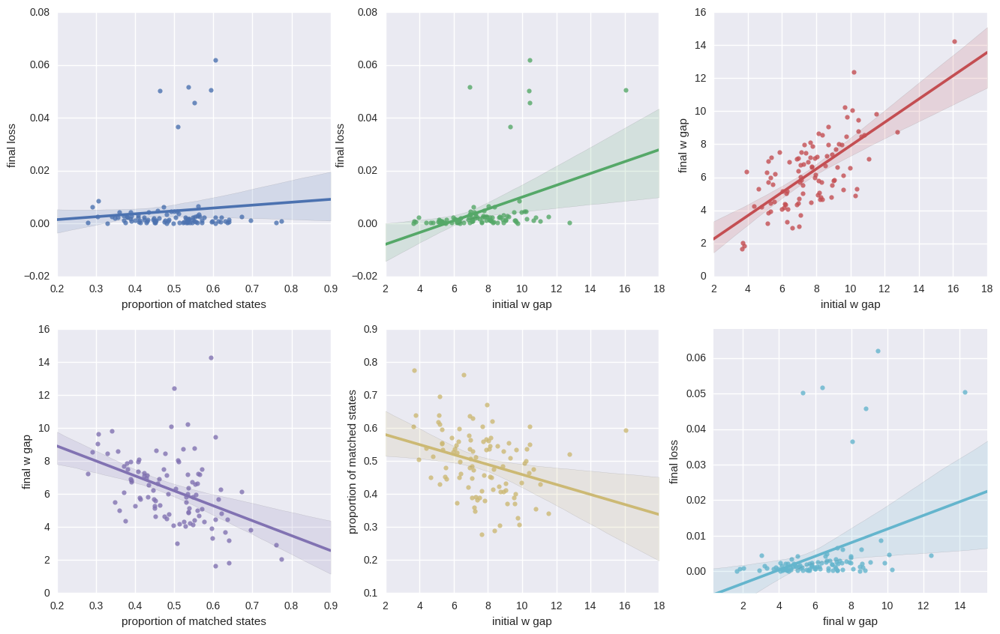

In [51]:
generate_all_plots(all_prop_matched_states,all_final_loss,all_final_w_gaps,all_initial_w_gaps)

In [ ]:
# %matplotlib notebook

# 3D Plot of W
fig = plt.figure(figsize=(10,10))
ax = plt.gca(projection='3d')

ax.scatter(final_weights[:,0], final_weights[:,1], final_weights[:,2])
ax.scatter(w['weights'][0][0],w['weights'][1][0],w['weights'][2][0],c='r')
ax.set_xlabel('w1')
ax.set_ylabel('w2')
ax.set_zlabel('w3')
plt.show()

### Experiment 4

Do slightly perturbed versions of $w^*$ converge to $w^*$?? (modify level of perturbation?)

In [23]:
p = 10    # number of dimensions
N = 1000  # number of samples
q = p     # rank of covariance matrix for generating samples
h = 3     # number of hidden units

input_dict = dict(p=p,h=h)
X,Y,hs,w = generate_data(N,q,input_dict,seed=0,build_func=mlp)

list_init_perturb_w_true = [0.5,1.0,2.0,5.0,10.0]
losses = np.zeros((len(list_init_perturb_w_true),100))
for i,init_perturb_w_true in enumerate(list_init_perturb_w_true):

    all_prop_matched_states,all_final_loss,all_final_w_gaps,all_initial_w_gaps = \
        run_experiment(X,Y,hs,w,input_dict,100,build_func=mlp,plot=False,init_perturb_w_true=init_perturb_w_true)
        
    losses[i,:] = all_final_loss

Epoch 18/200 (0.219 s), batch 10.0/10 (0.009 s): loss 0.061, w gap: 7.420

Epoch 36/200 (0.424 s), batch 1.0/10 (0.001 s): loss 0.041, w gap: 7.189

Epoch 52/200 (0.625 s), batch 7.0/10 (0.006 s): loss 0.052, w gap: 7.012

Epoch 68/200 (0.825 s), batch 7.0/10 (0.005 s): loss 0.035, w gap: 6.854

Epoch 83/200 (1.024 s), batch 10.0/10 (0.008 s): loss 0.036, w gap: 6.720

Epoch 98/200 (1.228 s), batch 10.0/10 (0.008 s): loss 0.028, w gap: 6.598

Epoch 113/200 (1.436 s), batch 6.0/10 (0.007 s): loss 0.043, w gap: 6.481

Epoch 127/200 (1.636 s), batch 5.0/10 (0.005 s): loss 0.034, w gap: 6.381

Epoch 141/200 (1.837 s), batch 5.0/10 (0.004 s): loss 0.022, w gap: 6.293

Epoch 154/200 (2.033 s), batch 10.0/10 (0.009 s): loss 0.019, w gap: 6.219

Epoch 168/200 (2.240 s), batch 3.0/10 (0.002 s): loss 0.020, w gap: 6.153

Epoch 181/200 (2.441 s), batch 1.0/10 (0.001 s): loss 0.016, w gap: 6.097

Epoch 193/200 (2.639 s), batch 10.0/10 (0.007 s): loss 0.012, w gap: 6.047

Epoch 200/200 (2.751 s), batch 10.0/10 (0.007 s): loss 0.011, w gap: 6.022
Done with 1/100 (2.81 s elapsed)
Epoch 200/200 (2.765 s), batch 10.0/10 (0.008 s): loss 0.006, w gap: 9.301
Done with 2/100 (5.68 s elapsed)
Epoch 200/200 (2.959 s), batch 10.0/10 (0.009 s): loss 0.172, w gap: 14.054
Done with 3/100 (8.71 s elapsed)
Epoch 200/200 (2.818 s), batch 10.0/10 (0.007 s): loss 0.046, w gap: 8.454
Done with 4/100 (11.59 s elapsed)
Epoch 200/200 (2.805 s), batch 10.0/10 (0.008 s): loss 0.072, w gap: 8.064
Done with 5/100 (14.48 s elapsed)
Epoch 200/200 (2.797 s), batch 10.0/10 (0.009 s): loss 0.091, w gap: 14.490
Done with 6/100 (17.34 s elapsed)
Epoch 200/200 (2.995 s), batch 10.0/10 (0.009 s): loss 0.079, w gap: 14.331
Done with 7/100 (20.40 s elapsed)
Epoch 200/200 (2.790 s), batch 10.0/10 (0.009 s): loss 0.119, w gap: 16.702
Done with 8/100 (23.25 s elapsed)
Epoch 200/200 (2.791 s), batch 10.0/10 (0.008 s): loss 0.069, w gap: 11.455
Done with 9/100 (26.13 s elapsed)
Epoch 200/200 (2.

Epoch 18/200 (0.224 s), batch 4.0/10 (0.003 s): loss 0.117, w gap: 10.696

Epoch 35/200 (0.424 s), batch 3.0/10 (0.002 s): loss 0.102, w gap: 10.595

Epoch 50/200 (0.621 s), batch 10.0/10 (0.012 s): loss 0.128, w gap: 10.533

Epoch 66/200 (0.826 s), batch 10.0/10 (0.007 s): loss 0.104, w gap: 10.489

Epoch 82/200 (1.031 s), batch 8.0/10 (0.006 s): loss 0.117, w gap: 10.443

Epoch 96/200 (1.228 s), batch 10.0/10 (0.009 s): loss 0.105, w gap: 10.390

Epoch 111/200 (1.431 s), batch 10.0/10 (0.008 s): loss 0.101, w gap: 10.325

Epoch 126/200 (1.637 s), batch 3.0/10 (0.002 s): loss 0.113, w gap: 10.265

Epoch 140/200 (1.838 s), batch 4.0/10 (0.003 s): loss 0.140, w gap: 10.213

Epoch 153/200 (2.039 s), batch 7.0/10 (0.006 s): loss 0.112, w gap: 10.166

Epoch 166/200 (2.239 s), batch 10.0/10 (0.007 s): loss 0.086, w gap: 10.119

Epoch 179/200 (2.441 s), batch 10.0/10 (0.009 s): loss 0.069, w gap: 10.085

Epoch 192/200 (2.649 s), batch 8.0/10 (0.006 s): loss 0.090, w gap: 10.052

Epoch 200/200 (2.781 s), batch 10.0/10 (0.009 s): loss 0.068, w gap: 10.030
Done with 75/100 (217.33 s elapsed)
Epoch 200/200 (2.783 s), batch 10.0/10 (0.010 s): loss 0.055, w gap: 17.367
Done with 76/100 (220.18 s elapsed)
Epoch 200/200 (2.794 s), batch 10.0/10 (0.008 s): loss 0.052, w gap: 17.452
Done with 77/100 (223.14 s elapsed)
Epoch 200/200 (2.802 s), batch 10.0/10 (0.008 s): loss 0.058, w gap: 15.489
Done with 78/100 (226.00 s elapsed)
Epoch 200/200 (2.797 s), batch 10.0/10 (0.011 s): loss 0.118, w gap: 14.693
Done with 79/100 (228.86 s elapsed)
Epoch 200/200 (2.985 s), batch 10.0/10 (0.008 s): loss 0.049, w gap: 12.122
Done with 80/100 (231.91 s elapsed)
Epoch 200/200 (2.794 s), batch 10.0/10 (0.011 s): loss 0.113, w gap: 13.485
Done with 81/100 (234.77 s elapsed)
Epoch 200/200 (2.786 s), batch 10.0/10 (0.008 s): loss 0.018, w gap: 14.024
Done with 82/100 (237.62 s elapsed)
Epoch 200/200 (2.779 s), batch 10.0/10 (0.010 s): loss 0.006, w gap: 14.694
Done with 83/100 (240.46 s e

Epoch 18/200 (0.223 s), batch 10.0/10 (0.008 s): loss 0.043, w gap: 3.389

Epoch 34/200 (0.427 s), batch 10.0/10 (0.009 s): loss 0.023, w gap: 3.301

Epoch 51/200 (0.631 s), batch 2.0/10 (0.003 s): loss 0.025, w gap: 3.221

Epoch 66/200 (0.832 s), batch 10.0/10 (0.007 s): loss 0.023, w gap: 3.147

Epoch 81/200 (1.032 s), batch 10.0/10 (0.009 s): loss 0.020, w gap: 3.085

Epoch 96/200 (1.236 s), batch 10.0/10 (0.009 s): loss 0.022, w gap: 3.027

Epoch 111/200 (1.442 s), batch 6.0/10 (0.004 s): loss 0.016, w gap: 2.972

Epoch 125/200 (1.643 s), batch 2.0/10 (0.002 s): loss 0.018, w gap: 2.925

Epoch 138/200 (1.844 s), batch 10.0/10 (0.008 s): loss 0.022, w gap: 2.881

Epoch 152/200 (2.045 s), batch 1.0/10 (0.001 s): loss 0.021, w gap: 2.844

Epoch 165/200 (2.246 s), batch 9.0/10 (0.008 s): loss 0.012, w gap: 2.808

Epoch 178/200 (2.448 s), batch 5.0/10 (0.005 s): loss 0.011, w gap: 2.776

Epoch 190/200 (2.642 s), batch 10.0/10 (0.010 s): loss 0.009, w gap: 2.748

Epoch 200/200 (2.802 s), batch 10.0/10 (0.007 s): loss 0.012, w gap: 2.726
Done with 49/100 (142.39 s elapsed)
Epoch 200/200 (2.965 s), batch 10.0/10 (0.008 s): loss 0.043, w gap: 5.004
Done with 50/100 (145.42 s elapsed)
Epoch 200/200 (2.804 s), batch 10.0/10 (0.009 s): loss 0.003, w gap: 1.360
Done with 51/100 (148.29 s elapsed)
Epoch 200/200 (2.793 s), batch 10.0/10 (0.008 s): loss 0.045, w gap: 3.462
Done with 52/100 (151.15 s elapsed)
Epoch 200/200 (2.913 s), batch 10.0/10 (0.009 s): loss 0.006, w gap: 4.331
Done with 53/100 (154.12 s elapsed)
Epoch 200/200 (2.801 s), batch 10.0/10 (0.009 s): loss 0.009, w gap: 2.510
Done with 54/100 (156.99 s elapsed)
Epoch 200/200 (2.808 s), batch 10.0/10 (0.010 s): loss 0.010, w gap: 2.534
Done with 55/100 (159.86 s elapsed)
Epoch 200/200 (2.775 s), batch 10.0/10 (0.008 s): loss 0.002, w gap: 2.741
Done with 56/100 (162.70 s elapsed)
Epoch 200/200 (3.037 s), batch 10.0/10 (0.008 s): loss 0.015, w gap: 3.064
Done with 57/100 (165.83 s elapsed)
E

Epoch 26/200 (0.317 s), batch 6.0/10 (0.007 s): loss 0.013, w gap: 1.120

Epoch 43/200 (0.518 s), batch 4.0/10 (0.003 s): loss 0.013, w gap: 1.067

Epoch 59/200 (0.719 s), batch 3.0/10 (0.002 s): loss 0.004, w gap: 1.038

Epoch 74/200 (0.920 s), batch 9.0/10 (0.008 s): loss 0.003, w gap: 1.021

Epoch 89/200 (1.120 s), batch 3.0/10 (0.002 s): loss 0.002, w gap: 1.011

Epoch 103/200 (1.321 s), batch 6.0/10 (0.005 s): loss 0.002, w gap: 1.002

Epoch 117/200 (1.521 s), batch 5.0/10 (0.005 s): loss 0.002, w gap: 0.995

Epoch 130/200 (1.717 s), batch 10.0/10 (0.011 s): loss 0.001, w gap: 0.989

Epoch 144/200 (1.924 s), batch 6.0/10 (0.005 s): loss 0.001, w gap: 0.983

Epoch 157/200 (2.125 s), batch 10.0/10 (0.007 s): loss 0.001, w gap: 0.979

Epoch 169/200 (2.388 s), batch 10.0/10 (0.007 s): loss 0.001, w gap: 0.975

Epoch 181/200 (2.595 s), batch 10.0/10 (0.008 s): loss 0.001, w gap: 0.971

Epoch 193/200 (2.805 s), batch 9.0/10 (0.008 s): loss 0.001, w gap: 0.968

Epoch 200/200 (2.938 s), batch 10.0/10 (0.012 s): loss 0.001, w gap: 0.966
Done with 23/100 (66.55 s elapsed)
Epoch 200/200 (2.813 s), batch 10.0/10 (0.008 s): loss 0.003, w gap: 0.748
Done with 24/100 (69.43 s elapsed)
Epoch 200/200 (2.783 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.459
Done with 25/100 (72.27 s elapsed)
Epoch 200/200 (2.782 s), batch 10.0/10 (0.009 s): loss 0.001, w gap: 0.457
Done with 26/100 (75.12 s elapsed)
Epoch 200/200 (2.900 s), batch 10.0/10 (0.008 s): loss 0.002, w gap: 0.285
Done with 27/100 (78.08 s elapsed)
Epoch 200/200 (2.765 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.487
Done with 28/100 (80.91 s elapsed)
Epoch 200/200 (2.819 s), batch 10.0/10 (0.011 s): loss 0.002, w gap: 0.467
Done with 29/100 (83.79 s elapsed)
Epoch 200/200 (2.920 s), batch 10.0/10 (0.008 s): loss 0.001, w gap: 0.282
Done with 30/100 (86.78 s elapsed)
Epoch 200/200 (2.778 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.480
Done with 31/100 (89.62 s elapsed)
Epoch 200/

Epoch 18/200 (0.225 s), batch 4.0/10 (0.003 s): loss 0.011, w gap: 0.566

Epoch 35/200 (0.426 s), batch 8.0/10 (0.008 s): loss 0.007, w gap: 0.533

Epoch 51/200 (0.627 s), batch 5.0/10 (0.005 s): loss 0.004, w gap: 0.511

Epoch 67/200 (0.829 s), batch 1.0/10 (0.001 s): loss 0.002, w gap: 0.494

Epoch 82/200 (1.029 s), batch 3.0/10 (0.002 s): loss 0.003, w gap: 0.481

Epoch 96/200 (1.227 s), batch 10.0/10 (0.010 s): loss 0.003, w gap: 0.469

Epoch 110/200 (1.430 s), batch 10.0/10 (0.009 s): loss 0.002, w gap: 0.459

Epoch 124/200 (1.633 s), batch 10.0/10 (0.007 s): loss 0.002, w gap: 0.450

Epoch 138/200 (1.838 s), batch 10.0/10 (0.008 s): loss 0.002, w gap: 0.443

Epoch 152/200 (2.045 s), batch 3.0/10 (0.005 s): loss 0.002, w gap: 0.436

Epoch 164/200 (2.241 s), batch 10.0/10 (0.008 s): loss 0.001, w gap: 0.430

Epoch 177/200 (2.443 s), batch 10.0/10 (0.007 s): loss 0.001, w gap: 0.424

Epoch 190/200 (2.651 s), batch 9.0/10 (0.008 s): loss 0.001, w gap: 0.419

Epoch 200/200 (2.813 s), batch 10.0/10 (0.009 s): loss 0.001, w gap: 0.415
Done with 97/100 (280.82 s elapsed)
Epoch 200/200 (2.829 s), batch 10.0/10 (0.008 s): loss 0.001, w gap: 0.710
Done with 98/100 (283.71 s elapsed)
Epoch 200/200 (2.807 s), batch 10.0/10 (0.010 s): loss 0.001, w gap: 0.320
Done with 99/100 (286.58 s elapsed)
Epoch 200/200 (2.996 s), batch 10.0/10 (0.010 s): loss 0.011, w gap: 0.480
Done with 100/100 (289.64 s elapsed)
Epoch 200/200 (2.779 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.080
Done with 1/100 (2.84 s elapsed)
Epoch 200/200 (2.775 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.073
Done with 2/100 (5.70 s elapsed)
Epoch 200/200 (2.819 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.057
Done with 3/100 (8.58 s elapsed)
Epoch 200/200 (2.783 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.063
Done with 4/100 (11.49 s elapsed)
Epoch 200/200 (2.851 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.048
Done with 5/100 (14.41 s elapsed)
Epoch 200/200

Epoch 20/200 (0.253 s), batch 10.0/10 (0.008 s): loss 0.001, w gap: 0.107

Epoch 37/200 (0.457 s), batch 6.0/10 (0.005 s): loss 0.001, w gap: 0.102

Epoch 53/200 (0.658 s), batch 8.0/10 (0.006 s): loss 0.000, w gap: 0.099

Epoch 69/200 (0.859 s), batch 1.0/10 (0.002 s): loss 0.000, w gap: 0.097

Epoch 84/200 (1.059 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.095

Epoch 99/200 (1.264 s), batch 4.0/10 (0.004 s): loss 0.000, w gap: 0.094

Epoch 114/200 (1.466 s), batch 7.0/10 (0.005 s): loss 0.000, w gap: 0.093

Epoch 128/200 (1.664 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.092

Epoch 142/200 (1.871 s), batch 5.0/10 (0.004 s): loss 0.000, w gap: 0.091

Epoch 155/200 (2.069 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.091

Epoch 169/200 (2.277 s), batch 3.0/10 (0.004 s): loss 0.000, w gap: 0.090

Epoch 181/200 (2.470 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.089

Epoch 194/200 (2.679 s), batch 6.0/10 (0.006 s): loss 0.000, w gap: 0.089

Epoch 200/200 (2.781 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.089
Done with 71/100 (206.06 s elapsed)
Epoch 200/200 (2.793 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.163
Done with 72/100 (208.92 s elapsed)
Epoch 200/200 (2.886 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.077
Done with 73/100 (211.87 s elapsed)
Epoch 200/200 (2.795 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.119
Done with 74/100 (214.73 s elapsed)
Epoch 200/200 (2.837 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.050
Done with 75/100 (217.63 s elapsed)
Epoch 200/200 (2.775 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.062
Done with 76/100 (220.47 s elapsed)
Epoch 200/200 (3.020 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.101
Done with 77/100 (223.55 s elapsed)
Epoch 200/200 (2.771 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.062
Done with 78/100 (226.38 s elapsed)
Epoch 200/200 (2.807 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.060
Done with 79/100 (229.25 s elapsed)
E

Epoch 19/200 (0.236 s), batch 6.0/10 (0.005 s): loss 0.001, w gap: 0.026

Epoch 35/200 (0.436 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.023

Epoch 52/200 (0.640 s), batch 5.0/10 (0.005 s): loss 0.000, w gap: 0.021

Epoch 67/200 (0.841 s), batch 2.0/10 (0.002 s): loss 0.000, w gap: 0.020

Epoch 81/200 (1.042 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.018

Epoch 96/200 (1.248 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.017

Epoch 111/200 (1.454 s), batch 5.0/10 (0.004 s): loss 0.000, w gap: 0.017

Epoch 125/200 (1.655 s), batch 9.0/10 (0.007 s): loss 0.000, w gap: 0.016

Epoch 138/200 (1.850 s), batch 10.0/10 (0.011 s): loss 0.000, w gap: 0.015

Epoch 152/200 (2.056 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.015

Epoch 166/200 (2.264 s), batch 9.0/10 (0.007 s): loss 0.000, w gap: 0.014

Epoch 179/200 (2.466 s), batch 6.0/10 (0.004 s): loss 0.000, w gap: 0.014

Epoch 191/200 (2.661 s), batch 10.0/10 (0.010 s): loss 0.000, w gap: 0.013

Epoch 200/200 (2.808 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.013
Done with 45/100 (130.59 s elapsed)
Epoch 200/200 (2.760 s), batch 10.0/10 (0.011 s): loss 0.000, w gap: 0.019
Done with 46/100 (133.42 s elapsed)
Epoch 200/200 (2.923 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.027
Done with 47/100 (136.41 s elapsed)
Epoch 200/200 (2.811 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.030
Done with 48/100 (139.28 s elapsed)
Epoch 200/200 (2.791 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.014
Done with 49/100 (142.14 s elapsed)
Epoch 200/200 (2.946 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.015
Done with 50/100 (145.15 s elapsed)
Epoch 200/200 (2.801 s), batch 10.0/10 (0.010 s): loss 0.000, w gap: 0.022
Done with 51/100 (148.02 s elapsed)
Epoch 200/200 (2.854 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.036
Done with 52/100 (150.93 s elapsed)
Epoch 200/200 (2.793 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.029
Done with 53/100 (153.79 s elapsed)
E

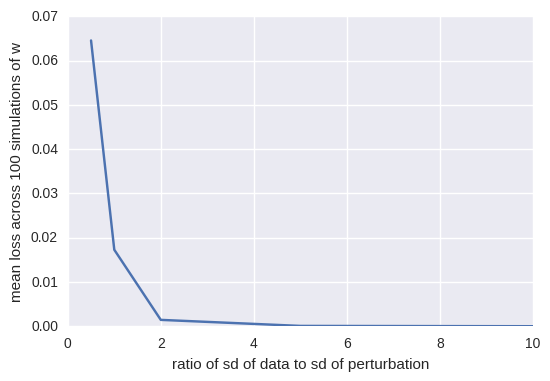

In [24]:
plt.plot(list_init_perturb_w_true,np.mean(losses,1))
plt.xlabel('ratio of sd of data to sd of perturbation')
plt.ylabel('mean loss across 100 simulations of w')

In [25]:
p = 10    # number of dimensions
N = 1000  # number of samples
q = p     # rank of covariance matrix for generating samples
h = 1     # number of hidden units

input_dict = dict(p=p,h=h)
X,Y,hs,w = generate_data(N,q,input_dict,seed=0,build_func=mlp)

list_init_perturb_w_true = [0.5,1.0,2.0,5.0,10.0]
losses = np.zeros((len(list_init_perturb_w_true),100))
for i,init_perturb_w_true in enumerate(list_init_perturb_w_true):

    all_prop_matched_states,all_final_loss,all_final_w_gaps,all_initial_w_gaps = \
        run_experiment(X,Y,hs,w,input_dict,100,build_func=mlp,plot=False,init_perturb_w_true=init_perturb_w_true)
        
    losses[i,:] = all_final_loss

Epoch 19/200 (0.223 s), batch 6.0/10 (0.004 s): loss 0.002, w gap: 2.359

Epoch 35/200 (0.420 s), batch 10.0/10 (0.008 s): loss 0.003, w gap: 2.304

Epoch 52/200 (0.625 s), batch 3.0/10 (0.002 s): loss 0.003, w gap: 2.267

Epoch 67/200 (0.825 s), batch 10.0/10 (0.007 s): loss 0.002, w gap: 2.240

Epoch 82/200 (1.030 s), batch 10.0/10 (0.007 s): loss 0.002, w gap: 2.220

Epoch 97/200 (1.236 s), batch 9.0/10 (0.008 s): loss 0.001, w gap: 2.204

Epoch 111/200 (1.437 s), batch 8.0/10 (0.007 s): loss 0.001, w gap: 2.192

Epoch 125/200 (1.638 s), batch 7.0/10 (0.006 s): loss 0.001, w gap: 2.182

Epoch 139/200 (1.838 s), batch 1.0/10 (0.001 s): loss 0.001, w gap: 2.174

Epoch 151/200 (2.037 s), batch 10.0/10 (0.009 s): loss 0.001, w gap: 2.167

Epoch 165/200 (2.245 s), batch 5.0/10 (0.004 s): loss 0.001, w gap: 2.162

Epoch 178/200 (2.447 s), batch 1.0/10 (0.001 s): loss 0.000, w gap: 2.158

Epoch 190/200 (2.646 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 2.154

Epoch 200/200 (2.809 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 2.151
Done with 1/100 (2.87 s elapsed)
Epoch 200/200 (3.007 s), batch 10.0/10 (0.008 s): loss 0.019, w gap: 1.725
Done with 2/100 (5.94 s elapsed)
Epoch 200/200 (2.781 s), batch 10.0/10 (0.008 s): loss 0.153, w gap: 11.760
Done with 3/100 (8.79 s elapsed)
Epoch 200/200 (2.786 s), batch 10.0/10 (0.007 s): loss 0.001, w gap: 1.059
Done with 4/100 (11.64 s elapsed)
Epoch 200/200 (2.790 s), batch 10.0/10 (0.008 s): loss 0.005, w gap: 1.593
Done with 5/100 (14.49 s elapsed)
Epoch 200/200 (2.803 s), batch 10.0/10 (0.009 s): loss 0.006, w gap: 1.459
Done with 6/100 (17.43 s elapsed)
Epoch 200/200 (2.816 s), batch 10.0/10 (0.008 s): loss 0.010, w gap: 3.491
Done with 7/100 (20.31 s elapsed)
Epoch 200/200 (2.784 s), batch 10.0/10 (0.007 s): loss 0.200, w gap: 8.491
Done with 8/100 (23.16 s elapsed)
Epoch 200/200 (3.027 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 3.115
Done with 9/100 (26.25 s elapsed)
Epoch 200/200 (2.779 

Epoch 34/200 (0.426 s), batch 10.0/10 (0.007 s): loss 0.171, w gap: 2.303

Epoch 50/200 (0.631 s), batch 10.0/10 (0.008 s): loss 0.104, w gap: 2.002

Epoch 65/200 (0.836 s), batch 10.0/10 (0.009 s): loss 0.072, w gap: 1.783

Epoch 81/200 (1.041 s), batch 10.0/10 (0.008 s): loss 0.040, w gap: 1.612

Epoch 97/200 (1.247 s), batch 1.0/10 (0.002 s): loss 0.028, w gap: 1.489

Epoch 111/200 (1.443 s), batch 10.0/10 (0.008 s): loss 0.037, w gap: 1.396

Epoch 126/200 (1.650 s), batch 6.0/10 (0.006 s): loss 0.018, w gap: 1.325

Epoch 140/200 (1.851 s), batch 1.0/10 (0.001 s): loss 0.023, w gap: 1.272

Epoch 153/200 (2.052 s), batch 5.0/10 (0.003 s): loss 0.015, w gap: 1.228

Epoch 164/200 (2.224 s), batch 10.0/10 (0.010 s): loss 0.012, w gap: 1.196

Epoch 176/200 (2.494 s), batch 6.0/10 (0.005 s): loss 0.008, w gap: 1.166

Epoch 187/200 (2.694 s), batch 8.0/10 (0.007 s): loss 0.012, w gap: 1.141

Epoch 198/200 (2.891 s), batch 10.0/10 (0.008 s): loss 0.010, w gap: 1.119

Epoch 200/200 (2.926 s), batch 10.0/10 (0.008 s): loss 0.011, w gap: 1.115
Done with 75/100 (218.04 s elapsed)
Epoch 200/200 (2.802 s), batch 10.0/10 (0.007 s): loss 0.172, w gap: 4.744
Done with 76/100 (220.91 s elapsed)
Epoch 200/200 (2.816 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 3.091
Done with 77/100 (223.78 s elapsed)
Epoch 200/200 (2.813 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 9.266
Done with 78/100 (226.66 s elapsed)
Epoch 200/200 (2.950 s), batch 10.0/10 (0.007 s): loss 0.001, w gap: 0.559
Done with 79/100 (229.68 s elapsed)
Epoch 200/200 (2.807 s), batch 10.0/10 (0.008 s): loss 0.358, w gap: 5.218
Done with 80/100 (232.55 s elapsed)
Epoch 200/200 (2.778 s), batch 10.0/10 (0.008 s): loss 0.319, w gap: 11.947
Done with 81/100 (235.39 s elapsed)
Epoch 200/200 (2.890 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 9.792
Done with 82/100 (238.38 s elapsed)
Epoch 200/200 (2.810 s), batch 10.0/10 (0.008 s): loss 0.223, w gap: 13.735
Done with 83/100 (241.25 s elapsed)

Epoch 28/200 (0.428 s), batch 7.0/10 (0.006 s): loss 0.287, w gap: 3.558

Epoch 44/200 (0.628 s), batch 7.0/10 (0.005 s): loss 0.231, w gap: 3.558

Epoch 59/200 (0.827 s), batch 10.0/10 (0.009 s): loss 0.269, w gap: 3.558

Epoch 75/200 (1.033 s), batch 1.0/10 (0.001 s): loss 0.310, w gap: 3.558

Epoch 89/200 (1.234 s), batch 2.0/10 (0.003 s): loss 0.193, w gap: 3.558

Epoch 103/200 (1.435 s), batch 3.0/10 (0.004 s): loss 0.237, w gap: 3.558

Epoch 116/200 (1.637 s), batch 10.0/10 (0.012 s): loss 0.209, w gap: 3.558

Epoch 130/200 (1.845 s), batch 6.0/10 (0.005 s): loss 0.274, w gap: 3.558

Epoch 143/200 (2.044 s), batch 10.0/10 (0.009 s): loss 0.258, w gap: 3.558

Epoch 156/200 (2.246 s), batch 10.0/10 (0.008 s): loss 0.260, w gap: 3.558

Epoch 169/200 (2.450 s), batch 10.0/10 (0.007 s): loss 0.178, w gap: 3.558

Epoch 182/200 (2.658 s), batch 8.0/10 (0.006 s): loss 0.215, w gap: 3.558

Epoch 194/200 (2.854 s), batch 10.0/10 (0.009 s): loss 0.235, w gap: 3.558

Epoch 200/200 (2.955 s), batch 10.0/10 (0.009 s): loss 0.312, w gap: 3.558
Done with 49/100 (142.50 s elapsed)
Epoch 200/200 (2.784 s), batch 10.0/10 (0.010 s): loss 0.215, w gap: 2.414
Done with 50/100 (145.35 s elapsed)
Epoch 200/200 (2.817 s), batch 10.0/10 (0.009 s): loss 0.001, w gap: 0.179
Done with 51/100 (148.23 s elapsed)
Epoch 200/200 (2.965 s), batch 10.0/10 (0.010 s): loss 0.182, w gap: 1.449
Done with 52/100 (151.26 s elapsed)
Epoch 200/200 (2.795 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.502
Done with 53/100 (154.12 s elapsed)
Epoch 200/200 (2.764 s), batch 10.0/10 (0.009 s): loss 0.007, w gap: 0.932
Done with 54/100 (156.95 s elapsed)
Epoch 200/200 (2.769 s), batch 10.0/10 (0.012 s): loss 0.000, w gap: 2.326
Done with 55/100 (159.78 s elapsed)
Epoch 200/200 (2.926 s), batch 10.0/10 (0.010 s): loss 0.009, w gap: 1.780
Done with 56/100 (162.77 s elapsed)
Epoch 200/200 (2.778 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.195
Done with 57/100 (165.61 s elapsed)
E

Epoch 34/200 (0.423 s), batch 9.0/10 (0.011 s): loss 0.003, w gap: 0.633

Epoch 51/200 (0.625 s), batch 3.0/10 (0.002 s): loss 0.001, w gap: 0.621

Epoch 66/200 (0.821 s), batch 10.0/10 (0.008 s): loss 0.001, w gap: 0.617

Epoch 82/200 (1.027 s), batch 3.0/10 (0.002 s): loss 0.000, w gap: 0.617

Epoch 96/200 (1.222 s), batch 10.0/10 (0.010 s): loss 0.000, w gap: 0.618

Epoch 111/200 (1.428 s), batch 7.0/10 (0.005 s): loss 0.000, w gap: 0.618

Epoch 125/200 (1.626 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.619

Epoch 139/200 (1.832 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.620

Epoch 153/200 (2.040 s), batch 2.0/10 (0.002 s): loss 0.000, w gap: 0.620

Epoch 166/200 (2.240 s), batch 2.0/10 (0.002 s): loss 0.000, w gap: 0.620

Epoch 178/200 (2.439 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.620

Epoch 191/200 (2.645 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.620

Epoch 200/200 (2.799 s), batch 10.0/10 (0.010 s): loss 0.000, w gap: 0.620
Done with 23/100 (66.98 s elapsed)
Epoch 200/200 (2.796 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.039
Done with 24/100 (69.85 s elapsed)
Epoch 200/200 (2.799 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.050
Done with 25/100 (72.71 s elapsed)
Epoch 200/200 (2.809 s), batch 10.0/10 (0.011 s): loss 0.000, w gap: 0.041
Done with 26/100 (75.65 s elapsed)
Epoch 200/200 (2.811 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.119
Done with 27/100 (78.52 s elapsed)
Epoch 200/200 (2.783 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.026
Done with 28/100 (81.37 s elapsed)
Epoch 200/200 (3.100 s), batch 10.0/10 (0.010 s): loss 0.000, w gap: 0.276
Done with 29/100 (84.54 s elapsed)
Epoch 200/200 (2.813 s), batch 10.0/10 (0.007 s): loss 0.001, w gap: 0.148
Done with 30/100 (87.42 s elapsed)
Epoch 200/200 (2.770 s), batch 10.0/10 (0.008 s): loss 0.001, w gap: 0.515
Done with 31/100 (90.25 s elapsed)
Epoch 200/

Epoch 26/200 (0.324 s), batch 10.0/10 (0.007 s): loss 0.232, w gap: 1.142

Epoch 43/200 (0.530 s), batch 7.0/10 (0.006 s): loss 0.228, w gap: 1.142

Epoch 59/200 (0.731 s), batch 3.0/10 (0.003 s): loss 0.355, w gap: 1.142

Epoch 74/200 (0.931 s), batch 10.0/10 (0.008 s): loss 0.223, w gap: 1.142

Epoch 90/200 (1.136 s), batch 1.0/10 (0.001 s): loss 0.272, w gap: 1.142

Epoch 104/200 (1.335 s), batch 10.0/10 (0.008 s): loss 0.361, w gap: 1.142

Epoch 119/200 (1.541 s), batch 1.0/10 (0.001 s): loss 0.246, w gap: 1.142

Epoch 132/200 (1.737 s), batch 10.0/10 (0.007 s): loss 0.367, w gap: 1.142

Epoch 146/200 (1.944 s), batch 10.0/10 (0.008 s): loss 0.211, w gap: 1.142

Epoch 159/200 (2.146 s), batch 10.0/10 (0.011 s): loss 0.156, w gap: 1.142

Epoch 172/200 (2.350 s), batch 10.0/10 (0.007 s): loss 0.122, w gap: 1.142

Epoch 185/200 (2.556 s), batch 10.0/10 (0.009 s): loss 0.286, w gap: 1.142

Epoch 198/200 (2.763 s), batch 6.0/10 (0.007 s): loss 0.132, w gap: 1.142

Epoch 200/200 (2.799 s), batch 10.0/10 (0.008 s): loss 0.224, w gap: 1.142
Done with 97/100 (282.50 s elapsed)
Epoch 200/200 (2.800 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.173
Done with 98/100 (285.37 s elapsed)
Epoch 200/200 (2.909 s), batch 10.0/10 (0.010 s): loss 0.000, w gap: 0.276
Done with 99/100 (288.34 s elapsed)
Epoch 200/200 (2.765 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.011
Done with 100/100 (291.17 s elapsed)
Epoch 200/200 (2.773 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.079
Done with 1/100 (2.84 s elapsed)
Epoch 200/200 (2.982 s), batch 10.0/10 (0.010 s): loss 0.000, w gap: 0.013
Done with 2/100 (5.88 s elapsed)
Epoch 200/200 (2.815 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.006
Done with 3/100 (8.76 s elapsed)
Epoch 200/200 (2.807 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.011
Done with 4/100 (11.63 s elapsed)
Epoch 200/200 (2.784 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.004
Done with 5/100 (14.49 s elapsed)
Epoch 200/200

Epoch 26/200 (0.437 s), batch 4.0/10 (0.005 s): loss 0.001, w gap: 0.040

Epoch 41/200 (0.639 s), batch 8.0/10 (0.007 s): loss 0.000, w gap: 0.036

Epoch 56/200 (0.841 s), batch 2.0/10 (0.002 s): loss 0.000, w gap: 0.034

Epoch 69/200 (1.039 s), batch 10.0/10 (0.011 s): loss 0.000, w gap: 0.033

Epoch 83/200 (1.246 s), batch 7.0/10 (0.007 s): loss 0.000, w gap: 0.032

Epoch 96/200 (1.446 s), batch 3.0/10 (0.002 s): loss 0.000, w gap: 0.031

Epoch 109/200 (1.648 s), batch 2.0/10 (0.002 s): loss 0.000, w gap: 0.030

Epoch 121/200 (1.845 s), batch 10.0/10 (0.011 s): loss 0.000, w gap: 0.029

Epoch 135/200 (2.051 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.029

Epoch 149/200 (2.259 s), batch 1.0/10 (0.001 s): loss 0.000, w gap: 0.028

Epoch 161/200 (2.452 s), batch 10.0/10 (0.010 s): loss 0.000, w gap: 0.028

Epoch 174/200 (2.661 s), batch 10.0/10 (0.010 s): loss 0.000, w gap: 0.027

Epoch 187/200 (2.862 s), batch 1.0/10 (0.001 s): loss 0.000, w gap: 0.027

Epoch 199/200 (3.062 s), batch 8.0/10 (0.006 s): loss 0.000, w gap: 0.027

Epoch 200/200 (3.079 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.027
Done with 71/100 (205.92 s elapsed)
Epoch 200/200 (3.004 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.085
Done with 72/100 (208.99 s elapsed)
Epoch 200/200 (2.800 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.008
Done with 73/100 (211.89 s elapsed)
Epoch 200/200 (2.812 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.006
Done with 74/100 (214.77 s elapsed)
Epoch 200/200 (2.815 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.003
Done with 75/100 (217.65 s elapsed)
Epoch 200/200 (2.808 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.011
Done with 76/100 (220.59 s elapsed)
Epoch 200/200 (2.817 s), batch 10.0/10 (0.010 s): loss 0.000, w gap: 0.006
Done with 77/100 (223.47 s elapsed)
Epoch 200/200 (2.837 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.005
Done with 78/100 (226.38 s elapsed)
Epoch 200/200 (3.036 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.041
Done with 79/100 (229.48 s elapsed)
E

Epoch 34/200 (0.425 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.004

Epoch 51/200 (0.630 s), batch 1.0/10 (0.001 s): loss 0.000, w gap: 0.003

Epoch 66/200 (0.830 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.003

Epoch 82/200 (1.035 s), batch 9.0/10 (0.007 s): loss 0.000, w gap: 0.003

Epoch 97/200 (1.236 s), batch 1.0/10 (0.001 s): loss 0.000, w gap: 0.003

Epoch 111/200 (1.438 s), batch 7.0/10 (0.006 s): loss 0.000, w gap: 0.003

Epoch 125/200 (1.638 s), batch 2.0/10 (0.002 s): loss 0.000, w gap: 0.003

Epoch 139/200 (1.839 s), batch 3.0/10 (0.003 s): loss 0.000, w gap: 0.003

Epoch 152/200 (2.037 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.003

Epoch 166/200 (2.245 s), batch 6.0/10 (0.005 s): loss 0.000, w gap: 0.003

Epoch 178/200 (2.440 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.003

Epoch 200/200 (2.881 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.003
Done with 45/100 (130.92 s elapsed)
Epoch 200/200 (2.798 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.013
Done with 46/100 (133.78 s elapsed)
Epoch 200/200 (2.800 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.002
Done with 47/100 (136.66 s elapsed)
Epoch 200/200 (2.818 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.004
Done with 48/100 (139.54 s elapsed)
Epoch 200/200 (3.012 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.003
Done with 49/100 (142.62 s elapsed)
Epoch 200/200 (2.814 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.006
Done with 50/100 (145.50 s elapsed)
Epoch 200/200 (2.756 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.009
Done with 51/100 (148.32 s elapsed)
Epoch 200/200 (2.901 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.002
Done with 52/100 (151.29 s elapsed)
Epoch 200/200 (2.788 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.003
Done with 53/100 (154.14 s elapsed)
E

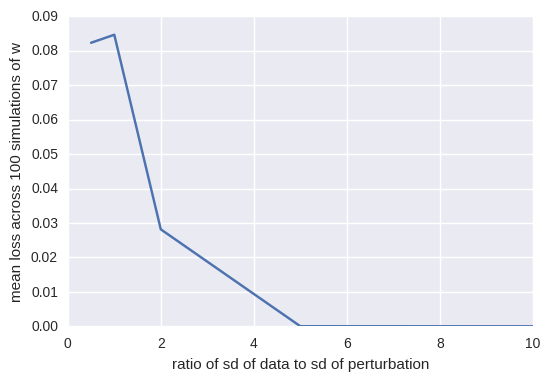

In [26]:
plt.plot(list_init_perturb_w_true,np.mean(losses,1))
plt.xlabel('ratio of sd of data to sd of perturbation')
plt.ylabel('mean loss across 100 simulations of w')

### Experiment 5

Try 2 layer net with 3 input nodes, 1 hidden node. Set $w^*$ to [1 -0.5 0.5], plot the obtained w*’s

In [27]:
# Parameters
p = 3    # number of dimensions
N = 1000  # number of samples
q = 3    # rank of covariance matrix for generating samples
h = 1     # number of hidden units

input_dict = dict(p=p,h=h)
X = generate_X(N,q,input_dict)
w = {'weights': np.array([[1.0],[-0.5],[0.5]])}
Y = generate_output(X,w,build_func=mlp_simple,batch_size=100)
hs = get_hidden_states(X,input_dict,w,build_func=mlp_simple)
print(generate_loss(X,Y,w,build_func=mlp_simple)) # Check to make sure optimal loss is 0

final_weights = np.zeros((100,p))
start = time.time()

for t in range(100):
    
    # Initialize weights
    weights = {k:np.random.normal(0,1./np.sqrt(np.shape(w[k])[0]),
                                          np.shape(w[k])) for k in w}

    # Run gradient descent
    tf.reset_default_graph()
    graph = graph_builder_wrapper(input_dict,build_func=mlp_simple)
    training_losses,training_w_gaps,w_hat,initial_train_loss,initial_train_w_gap,final_train_loss,final_w_gap = \
            train(X,Y,graph,200,100,w,w_initial=weights)
        
    final_weights[t] = w_hat['weights'].reshape(-1)
        
    print('%s/%s (%.2f elapsed)'%(t+1,100,time.time()-start))

0.0


Epoch 32/200 (0.374 s), batch 10.0/10 (0.007 s): loss 0.068, w gap: 0.800

Epoch 49/200 (0.578 s), batch 9.0/10 (0.007 s): loss 0.036, w gap: 0.438

Epoch 65/200 (0.779 s), batch 5.0/10 (0.003 s): loss 0.023, w gap: 0.249

Epoch 81/200 (0.979 s), batch 6.0/10 (0.004 s): loss 0.011, w gap: 0.144

Epoch 94/200 (1.145 s), batch 10.0/10 (0.008 s): loss 0.008, w gap: 0.096

Epoch 107/200 (1.408 s), batch 10.0/10 (0.009 s): loss 0.003, w gap: 0.067

Epoch 120/200 (1.613 s), batch 10.0/10 (0.008 s): loss 0.003, w gap: 0.049

Epoch 133/200 (1.821 s), batch 6.0/10 (0.006 s): loss 0.002, w gap: 0.038

Epoch 145/200 (2.021 s), batch 6.0/10 (0.005 s): loss 0.001, w gap: 0.031

Epoch 157/200 (2.222 s), batch 10.0/10 (0.008 s): loss 0.001, w gap: 0.026

Epoch 171/200 (2.431 s), batch 5.0/10 (0.005 s): loss 0.001, w gap: 0.022

Epoch 184/200 (2.631 s), batch 2.0/10 (0.001 s): loss 0.000, w gap: 0.020

Epoch 196/200 (2.829 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.018

Epoch 200/200 (2.893 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.017
1/100 (2.93 elapsed)


Epoch 28/200 (0.307 s), batch 6.0/10 (0.006 s): loss 0.040, w gap: 0.897

Epoch 45/200 (0.504 s), batch 10.0/10 (0.008 s): loss 0.026, w gap: 0.716

Epoch 63/200 (0.709 s), batch 7.0/10 (0.005 s): loss 0.017, w gap: 0.599

Epoch 80/200 (0.910 s), batch 7.0/10 (0.004 s): loss 0.009, w gap: 0.522

Epoch 96/200 (1.112 s), batch 8.0/10 (0.005 s): loss 0.009, w gap: 0.468

Epoch 111/200 (1.307 s), batch 10.0/10 (0.008 s): loss 0.007, w gap: 0.426

Epoch 126/200 (1.513 s), batch 6.0/10 (0.005 s): loss 0.004, w gap: 0.390

Epoch 140/200 (1.714 s), batch 7.0/10 (0.006 s): loss 0.005, w gap: 0.361

Epoch 153/200 (1.909 s), batch 10.0/10 (0.009 s): loss 0.005, w gap: 0.335

Epoch 167/200 (2.111 s), batch 10.0/10 (0.008 s): loss 0.003, w gap: 0.311

Epoch 181/200 (2.315 s), batch 10.0/10 (0.008 s): loss 0.003, w gap: 0.288

Epoch 195/200 (2.522 s), batch 2.0/10 (0.001 s): loss 0.004, w gap: 0.268

Epoch 200/200 (2.609 s), batch 10.0/10 (0.008 s): loss 0.005, w gap: 0.260
2/100 (5.58 elapsed)


Epoch 25/200 (0.277 s), batch 9.0/10 (0.006 s): loss 0.116, w gap: 1.412

Epoch 43/200 (0.479 s), batch 7.0/10 (0.007 s): loss 0.082, w gap: 0.810

Epoch 60/200 (0.679 s), batch 10.0/10 (0.007 s): loss 0.029, w gap: 0.454

Epoch 77/200 (0.884 s), batch 10.0/10 (0.007 s): loss 0.025, w gap: 0.260

Epoch 93/200 (1.086 s), batch 10.0/10 (0.011 s): loss 0.013, w gap: 0.162

Epoch 108/200 (1.287 s), batch 10.0/10 (0.008 s): loss 0.007, w gap: 0.111

Epoch 123/200 (1.488 s), batch 10.0/10 (0.008 s): loss 0.005, w gap: 0.080

Epoch 138/200 (1.695 s), batch 4.0/10 (0.003 s): loss 0.003, w gap: 0.062

Epoch 152/200 (1.892 s), batch 10.0/10 (0.008 s): loss 0.002, w gap: 0.051

Epoch 166/200 (2.098 s), batch 10.0/10 (0.008 s): loss 0.002, w gap: 0.044

Epoch 180/200 (2.301 s), batch 10.0/10 (0.007 s): loss 0.001, w gap: 0.038

Epoch 194/200 (2.510 s), batch 10.0/10 (0.008 s): loss 0.001, w gap: 0.034

Epoch 200/200 (2.606 s), batch 10.0/10 (0.008 s): loss 0.001, w gap: 0.033
3/100 (8.22 elapsed)


Epoch 24/200 (0.274 s), batch 10.0/10 (0.008 s): loss 0.006, w gap: 0.114

Epoch 42/200 (0.478 s), batch 7.0/10 (0.005 s): loss 0.002, w gap: 0.091

Epoch 59/200 (0.679 s), batch 4.0/10 (0.003 s): loss 0.002, w gap: 0.078

Epoch 75/200 (0.879 s), batch 10.0/10 (0.006 s): loss 0.001, w gap: 0.068

Epoch 91/200 (1.081 s), batch 10.0/10 (0.007 s): loss 0.001, w gap: 0.061

Epoch 107/200 (1.286 s), batch 6.0/10 (0.005 s): loss 0.001, w gap: 0.055

Epoch 121/200 (1.480 s), batch 10.0/10 (0.010 s): loss 0.001, w gap: 0.051

Epoch 136/200 (1.686 s), batch 10.0/10 (0.007 s): loss 0.001, w gap: 0.046

Epoch 151/200 (1.891 s), batch 10.0/10 (0.009 s): loss 0.001, w gap: 0.043

Epoch 165/200 (2.093 s), batch 10.0/10 (0.007 s): loss 0.001, w gap: 0.039

Epoch 179/200 (2.301 s), batch 8.0/10 (0.006 s): loss 0.001, w gap: 0.037

Epoch 192/200 (2.498 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.034

Epoch 200/200 (2.615 s), batch 10.0/10 (0.007 s): loss 0.000, w gap: 0.033
4/100 (10.88 elapsed)
Epoch 200/200 (2.830 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.001
5/100 (13.75 elapsed)
Epoch 200/200 (2.636 s), batch 10.0/10 (0.008 s): loss 0.002, w gap: 0.167
6/100 (16.43 elapsed)
Epoch 200/200 (2.643 s), batch 10.0/10 (0.008 s): loss 0.004, w gap: 0.278
7/100 (19.11 elapsed)
Epoch 200/200 (2.622 s), batch 10.0/10 (0.006 s): loss 0.022, w gap: 1.860
8/100 (21.77 elapsed)
Epoch 200/200 (2.702 s), batch 10.0/10 (0.007 s): loss 0.003, w gap: 0.292
9/100 (24.52 elapsed)
Epoch 200/200 (2.603 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.008
10/100 (27.16 elapsed)
Epoch 200/200 (2.609 s), batch 10.0/10 (0.008 s): loss 0.002, w gap: 0.122
11/100 (29.81 elapsed)
Epoch 200/200 (2.643 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.001
12/100 (32.49 elapsed)
Epoch 200/200 (2.609 s), batch 10.0/10 (0.009 s): loss 0.004, w gap: 0.247
13/100 (35.21 elapsed)
Epoch 200/200 (2.642 s), b

Epoch 37/200 (0.415 s), batch 10.0/10 (0.008 s): loss 0.071, w gap: 0.711

Epoch 54/200 (0.617 s), batch 10.0/10 (0.007 s): loss 0.033, w gap: 0.390

Epoch 71/200 (0.822 s), batch 10.0/10 (0.008 s): loss 0.014, w gap: 0.214

Epoch 88/200 (1.027 s), batch 5.0/10 (0.003 s): loss 0.010, w gap: 0.125

Epoch 104/200 (1.228 s), batch 7.0/10 (0.006 s): loss 0.003, w gap: 0.078

Epoch 119/200 (1.422 s), batch 10.0/10 (0.006 s): loss 0.003, w gap: 0.053

Epoch 134/200 (1.630 s), batch 3.0/10 (0.002 s): loss 0.001, w gap: 0.039

Epoch 148/200 (1.829 s), batch 10.0/10 (0.006 s): loss 0.001, w gap: 0.030

Epoch 162/200 (2.033 s), batch 10.0/10 (0.007 s): loss 0.001, w gap: 0.025

Epoch 176/200 (2.239 s), batch 10.0/10 (0.010 s): loss 0.001, w gap: 0.022

Epoch 190/200 (2.448 s), batch 9.0/10 (0.006 s): loss 0.000, w gap: 0.019

Epoch 200/200 (2.606 s), batch 10.0/10 (0.010 s): loss 0.000, w gap: 0.018
87/100 (237.39 elapsed)
Epoch 200/200 (2.651 s), batch 10.0/10 (0.009 s): loss 0.001, w gap: 0.046
88/100 (240.08 elapsed)
Epoch 200/200 (2.842 s), batch 10.0/10 (0.007 s): loss 0.008, w gap: 0.515
89/100 (242.96 elapsed)
Epoch 200/200 (2.656 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.024
90/100 (245.66 elapsed)
Epoch 200/200 (2.817 s), batch 10.0/10 (0.008 s): loss 0.004, w gap: 0.283
91/100 (248.51 elapsed)
Epoch 200/200 (2.649 s), batch 10.0/10 (0.008 s): loss 0.003, w gap: 0.150
92/100 (251.23 elapsed)
Epoch 200/200 (2.819 s), batch 10.0/10 (0.011 s): loss 0.001, w gap: 0.035
93/100 (254.09 elapsed)
Epoch 200/200 (2.629 s), batch 10.0/10 (0.009 s): loss 0.000, w gap: 0.004
94/100 (256.76 elapsed)
Epoch 200/200 (2.604 s), batch 10.0/10 (0.008 s): loss 0.000, w gap: 0.022
95/100 (259.40 elapsed)
Epoch 200/200 (2.632 s), batch 10.0/10 (0.007 s): loss 0.001, w gap: 0.077
96/100 (262.08 elapsed)
Epoch 200/

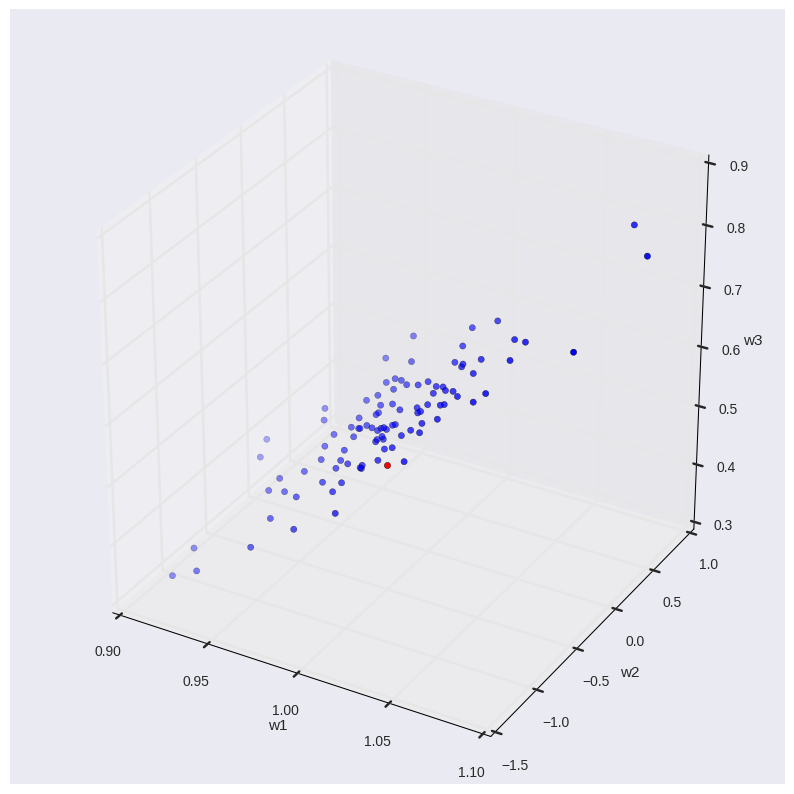

In [32]:
# %matplotlib notebook

# 3D Plot of W
fig = plt.figure(figsize=(10,10))
ax = plt.gca(projection='3d')

ax.scatter(final_weights[:,0], final_weights[:,1], final_weights[:,2])
ax.scatter(w['weights'][0][0],w['weights'][1][0],w['weights'][2][0],c='r')
ax.set_xlabel('w1')
ax.set_ylabel('w2')
ax.set_zlabel('w3')
plt.show()